Import plot and numerical dependencies

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler
import plotly.graph_objects as go
from plotly.graph_objs import Scatter

Let's start by defining a functions for generating a wave, and use it to plot a wave of period 10 with 520 samples and amplitude 1.

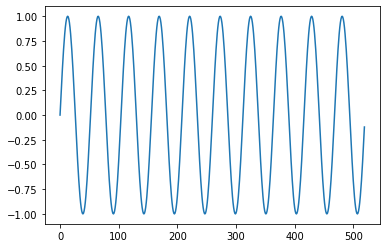

In [2]:
def wave(frequency, resolution, amplitude, fn=np.sin):
    length = np.pi * 2 * frequency
    my_wave = fn(np.arange(0, length, length / resolution))
    return my_wave * amplitude

series = wave(10, 520, 1)
plt.plot(series)
plt.show()

Define some plot functions. One uses matplotlib, while the other uses plotly. Plotly is better when you want to interact to better analize the graphic.

In [3]:
def plot(series: list, labels: list, show=True, ax = None, title = ''):
    if ax == None:
        plt.figure(figsize = (15, 6))
    for i, s in enumerate(series):
        module, title_fn = (plt, plt.title) if ax == None else (ax, ax.set_title)
        title_fn(title)
        module.plot(s, label=labels[i])
    if show:
        plt.legend(bbox_to_anchor =(1.25, 1))
        plt.show()
        
def plot_px(series: list, labels: list, title = ''):
    fig = go.Figure(layout_title_text=title)
    for i, data in enumerate(series):
        data = pd.Series(data)
        fig = fig.add_trace(Scatter(x = data.index, y = data, mode='lines', name=f'{labels[i]}'))
    fig.show()

Instatiate a scaler and fit it to the series. It is better to scale the series, as performs better with values between 0 and 1.

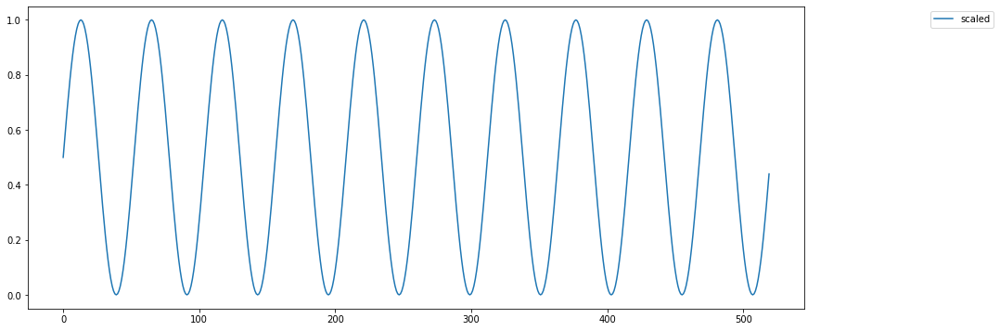

In [4]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler
scaler = MinMaxScaler()
scaled_series = scaler.fit_transform(series.reshape(-1, 1)).reshape(-1)
plot([scaled_series], ['scaled'])

We need to prepare the dataset to train the model. Let's start by trying to forecast the value of time `t` by feeding the value at time `t - 1`.

The previous values at time `t - n` are named *lags*. Here we are using 1 lag,

In [5]:
def prepare_lags(series: np.array, lags: int):
    range_right = lags + 1
    series_df = pd.Series(series)
    lagged_series = {f'y - {range_right - i}':series_df.shift(range_right - i) for i in range(1, range_right)}
    lagged_series_df = pd.DataFrame(lagged_series)
    lagged_series_df['y'] = series
    lagged_series_df = lagged_series_df.dropna()
    
    return lagged_series_df

lagged_series_df = prepare_lags(scaled_series, lags=1)
lagged_series_df.head(10)

,y - 1,y
1,0.500000,0.560268
2,0.560268,0.619658
3,0.619658,0.677302
4,0.677302,0.732362
5,0.732362,0.784032
6,0.784032,0.831561
7,0.831561,0.874255
8,0.874255,0.911492
9,0.911492,0.942728
10,0.942728,0.967508


Split our dataset into train and test sets. We use the 60% for train and 40% for test.

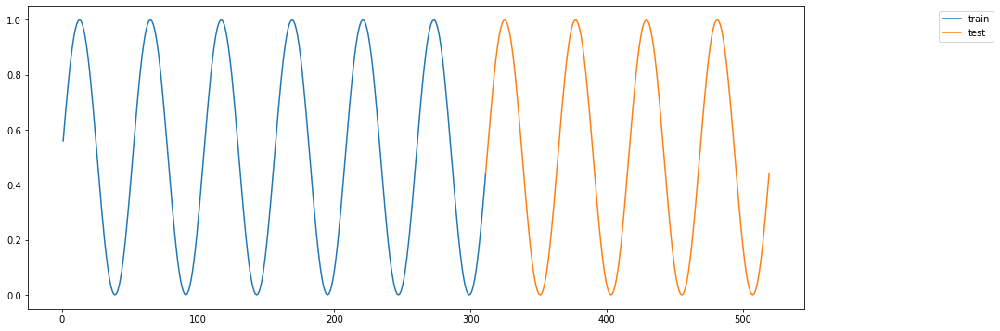

In [6]:
def split_test(series_df: pd.DataFrame, split_percentage: float):
    train_len = int(len(series_df) * split_percentage)
    train_df = series_df.loc[:train_len]
    test_df = series_df.loc[train_len:]
    
    return train_df.values[:, :-1], train_df.values[:, -1], test_df.values[:, :-1], test_df.values[:, -1], train_df, test_df

X_train, y_train, X_test, y_test, train_df, test_df = split_test(lagged_series_df, 0.6)
plot([train_df['y'], test_df['y']], labels=['train', 'test'])

Let's now import from tensorflow and keras, what we need for neural networks training.

In [7]:
import tensorflow as tf
tf.debugging.set_log_device_placement(False)
tf.config.set_visible_devices([], 'GPU')

from tensorflow import keras
from keras import layers, activations, optimizers
from keras.callbacks import EarlyStopping
from sklearn.metrics import mean_squared_error
import math

We are going to train the model using **Adam** gradient descent optimizer, and **mean squared error** as the function to measure the training error. We are going to train with a **batch size of 32** and a maximum of **200 epochs**. Epochs are **early stopped**, if no further improvement is observed for 30 consecutive epochs.

Once the model is trained, we will test it trying to predict the test values, one value at time. 

We will evaluate the quality of the model by measuring the **root mean squared error** between the actual test values and the predicted values.
We train the models 5 times each, in order to deal with the randomness of the training. Then we also take as second parameter of quality, the **standard deviation of the error**. This gives us a measure of the stability of the model.

As we scales values between 0 and 1 for training, we have to unscale before comparing them to the test values.

Let's define some helper functions in order to conduct the experiments.

In [8]:
def root_mean_squared_error(y, y_pred):
    return math.sqrt(mean_squared_error(y, y_pred))

def evaluate(y_test, forecast, show=True, ax=None):
    error = root_mean_squared_error(y_test, forecast)
    plot([y_test, forecast], ['actual', 'predicted'], show=show, ax=ax, title=f'error: {error}')
    
def unscale(series: np.array, scaler: MinMaxScaler):
    return scaler.inverse_transform(series.reshape(-1, 1)).reshape(-1)
    
def run_model(
    model_layers: list, 
    X_train: np.array, 
    y_train: np.array, 
    X_test: np.array, 
    y_test: np.array, 
    epochs:int,
    batch_size=32, 
    name='',
    early_stop=True,
    learning_rate=0.001,
    verbose=True
    ):
    
    early_stop_cb = EarlyStopping(
        monitor = 'val_loss', min_delta = 0.0001,
        patience = 30, mode = 'min', verbose = verbose,
        restore_best_weights = True)
    
    model = keras.models.clone_model(keras.Sequential(model_layers, name=name))
    model.compile(optimizer=optimizers.Adam(learning_rate = learning_rate), loss='mean_squared_error')

    history = model.fit(
        X_train, 
        y_train,
        epochs=epochs,
        batch_size=batch_size,
        validation_data=(X_test, y_test),
        verbose=False,
        callbacks=[early_stop_cb] if early_stop else []
        )

    forecast = model.predict(X_test, verbose=verbose)    
    return forecast, history, model

def evaluate_model(
    run_times: int,
    model_layers: list, 
    X_train: np.array, 
    y_train: np.array, 
    X_test: np.array, 
    y_test: np.array, 
    epochs:int,
    scaler: MinMaxScaler,
    batch_size=32,
    name='',
    early_stop=True, 
    learning_rate=0.001,
    verbose=True,
    print_plot=True,
    print_summary=True
    ):
    
    errors = []
    forecasts = []
    models = []
    histories = []
    y_test_unscaled = unscale(y_test, scaler)
    
    for _ in range(run_times):
        forecast, history, model = run_model(
            model_layers, 
            X_train, y_train, X_test, y_test,
            epochs=epochs, 
            batch_size=batch_size,
            name=name,
            early_stop=early_stop,
            learning_rate=learning_rate,
            verbose=verbose
        )

        forecast = unscale(forecast, scaler)
        error = root_mean_squared_error(y_test_unscaled, forecast)
        errors.append(error)
        forecasts.append(forecast)
        models.append(model)
        histories.append(history)
        
    error_avg = np.array(errors).mean()
    error_std = np.array(errors).std()
    if print_summary:        
        models[0].summary()
        print(f'errors: {errors}')
        print(f'error avg: {error_avg}')    
        print(f'error std: {error_std}')
    
    if print_plot:
        _, ax = plt.subplots(1, len(histories), figsize=(25,6))
        for i, history in enumerate(histories):
            plot([history.history['loss'], history.history['val_loss']], labels=['loss', 'val_loss'], ax=ax[i], show=False)
        plt.legend(bbox_to_anchor =(1.25, 1))
        plt.show()
            
        plot([y_test_unscaled] + forecasts, ['actual'] + [f'prediction_{i}' for i in range(len(forecast))])
        plot_px([y_test_unscaled] + forecasts, ['actual'] + [f'prediction_{i}' for i in range(len(forecast))])
    
    return { name: (errors, error_avg, error_std) }

def baseline(test_series):
    _, ax = plt.subplots(1, 2, figsize=(25,6))
    evaluate(test_series, [test_series.mean()] * len(test_series), show=False, ax=ax[0])
    evaluate(test_series[1:], pd.DataFrame(test_series).shift(1).dropna(), show=False, ax=ax[1])
    plt.legend(bbox_to_anchor =(1.25, 1))
    plt.show()

Before starting with the experiments, let's define two **naives baseline models**, to compare: 
 1. the average value of the test set
 2. the same series shifted by 1 time period (i.e. the forecasted value of time `t` is the series value at time `t-1`)

Our NN models will have to perform better then these two.

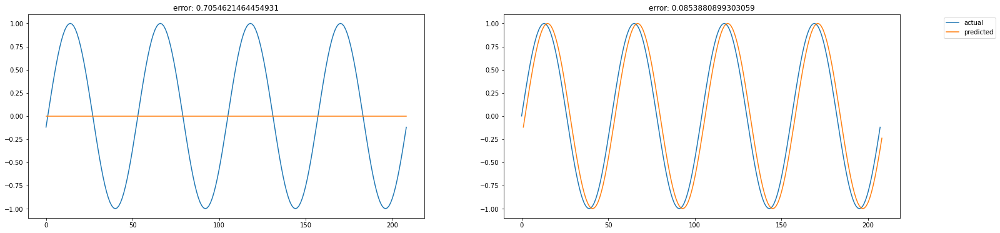

In [9]:
y_test_unscaled = unscale(y_test, scaler)
baseline(y_test_unscaled)

We will start from evaluating how a simple Multi layer perceptron is good in fitting this function, feeding it with one lag.
We define only one hidden layer with 5 neurons.

Model: "Simple_MLP_1_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_24 (Dense)            (None, 5)                 10        
                                                                 
 dense_25 (Dense)            (None, 1)                 6         
                                                                 
Total params: 16
Trainable params: 16
Non-trainable params: 0
_________________________________________________________________
errors: [0.08602043337714571, 0.7054667797413016, 0.08548437404038556, 0.08685460266493246, 0.08621068137598654]
error avg: 0.21000737423995036
error std: 0.24773009017623715


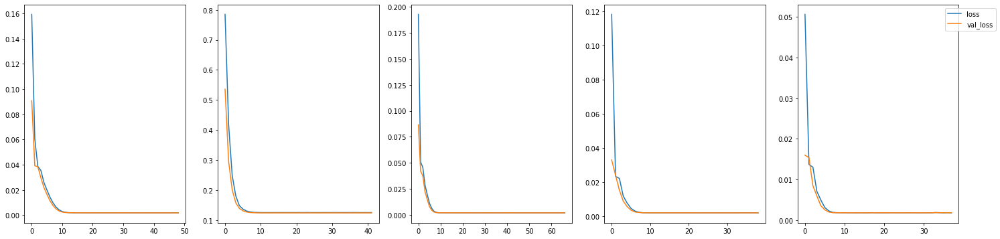

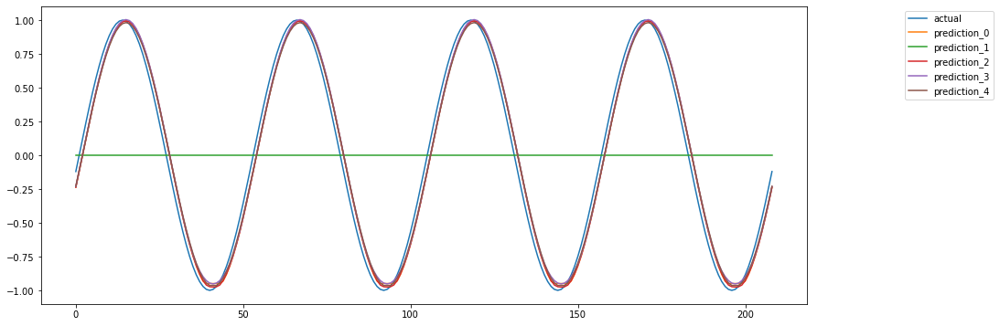

In [31]:

lags = 1
lagged_series_df = prepare_lags(scaled_series, lags=lags)
X_train, y_train, X_test, y_test, train_df, test_df = split_test(lagged_series_df, 0.6)

lags1_results = evaluate_model(
    5,
    [
        layers.Dense(5, activation=activations.relu),
        layers.Dense(1, activation=activations.linear)
    ], 
    X_train, y_train, X_test, y_test,
    epochs=100,
    batch_size=32,
    name=f'Simple_MLP_{lags}_lags',
    scaler=scaler,
    early_stop=True,
    learning_rate=0.01,
    verbose=False,
    print_summary=True
)

The result is not that good. The result looks similar to the shifted baseline model, but with a std value of 0.24 is not stable (like `prediction_1` suggests). Also, prediction_0 presents a strange plateu close to -1.

Let's try to emprove it by adding one more lag to the input.

In [217]:
lags=2
lagged_series_df = prepare_lags(scaled_series, lags=lags)
lagged_series_df.head(10)

,y - 2,y - 1,y
2,0.500000,0.560268,0.619658
3,0.560268,0.619658,0.677302
4,0.619658,0.677302,0.732362
5,0.677302,0.732362,0.784032
6,0.732362,0.784032,0.831561
7,0.784032,0.831561,0.874255
8,0.831561,0.874255,0.911492
9,0.874255,0.911492,0.942728
10,0.911492,0.942728,0.967508
11,0.942728,0.967508,0.985471


Model: "Simple_MLP_2_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_26 (Dense)            (None, 5)                 15        
                                                                 
 dense_27 (Dense)            (None, 1)                 6         
                                                                 
Total params: 21
Trainable params: 21
Non-trainable params: 0
_________________________________________________________________
errors: [0.0055140195209718084, 0.011594245414131866, 0.7039927658234498, 0.016030689395849795, 0.017617871072275897]
error avg: 0.15094991824533582
error std: 0.2765532963325547


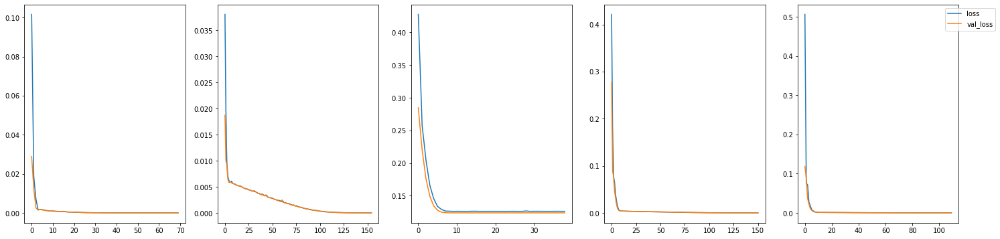

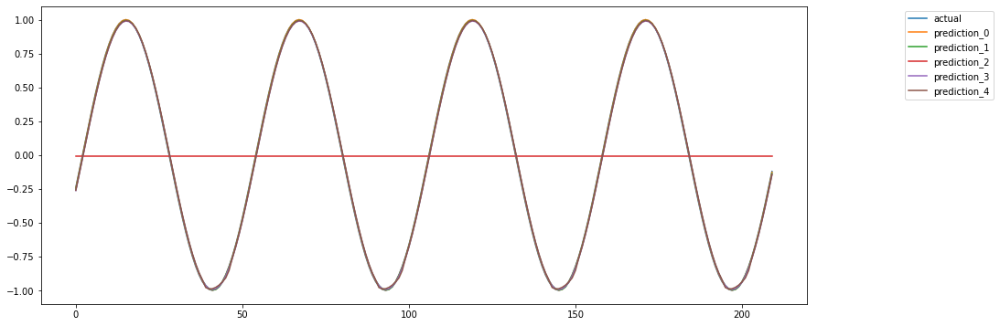

In [32]:
lags = 2
lagged_series_df = prepare_lags(scaled_series, lags=lags)
X_train, y_train, X_test, y_test, train_df, test_df = split_test(lagged_series_df, 0.6)

lags2_results = evaluate_model(
    5,
    [
        layers.Dense(5, activation=activations.relu),
        layers.Dense(1, activation=activations.linear)
    ], 
    X_train, y_train, X_test, y_test,
    epochs=200,
    batch_size=32,
    name=f'Simple_MLP_{lags}_lags',
    scaler=scaler,
    early_stop=True,
    learning_rate=0.01,    
    verbose=False,
    print_summary=True
)

Now the model is able to learn the function with a very low error (`prediction_0`, `prection_1`, `prection_3` and `prediction_4`), but is not yet stable enough, with and std value of 0.27 (`prediction_2`).

Anyway, we have evidence that feeding more lags is the right path. 
Let's continue highering the lags until the model become stable. 

With 3 lags we achieve the desired stability.

We are going to train it 10 times to be very sure about the stability.

Model: "Simple_MLP_3_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_28 (Dense)            (None, 5)                 20        
                                                                 
 dense_29 (Dense)            (None, 1)                 6         
                                                                 
Total params: 26
Trainable params: 26
Non-trainable params: 0
_________________________________________________________________
errors: [0.013085451621650711, 0.010601343421892494, 0.013642779886253897, 0.019100177615964498, 0.019510714975892483, 0.015362497281605608, 0.019574315689363818, 0.009154123597665884, 0.012730915964917032, 0.008985746783415398]
error avg: 0.014174806683862184
error std: 0.0038955655678797395


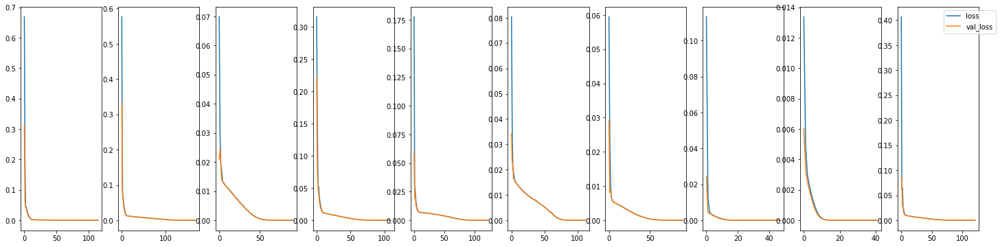

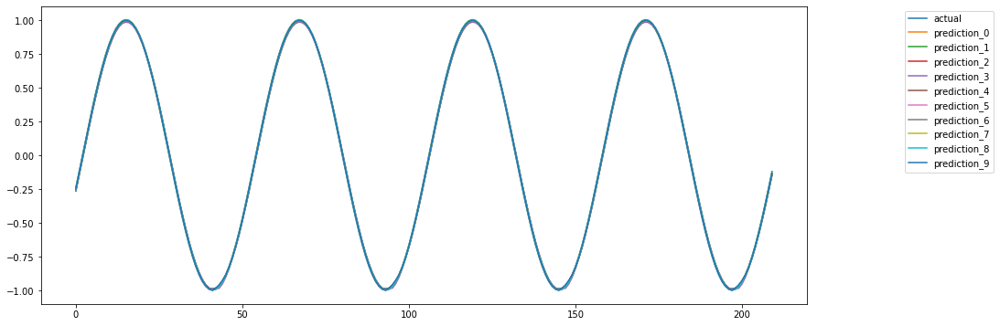

In [33]:
lags = 3
lagged_series_df = prepare_lags(scaled_series, lags=lags)
X_train, y_train, X_test, y_test, train_df, test_df = split_test(lagged_series_df, 0.6)

lags4_results = evaluate_model(
    10,
    [
        layers.Dense(5, activation=activations.relu),
        layers.Dense(1, activation=activations.linear)
    ], 
    X_train, y_train, X_test, y_test,
    epochs=200,
    batch_size=32,
    name=f'Simple_MLP_{lags}_lags',
    scaler=scaler,
    early_stop=True,
    learning_rate=0.01,
    verbose=False,
    print_summary=True
)

A MLP with one hidden layer, fed with 4 lags, is perfectly able to learn to predict a sinusoid.

But what if we add some **noise** to the sinusoid?

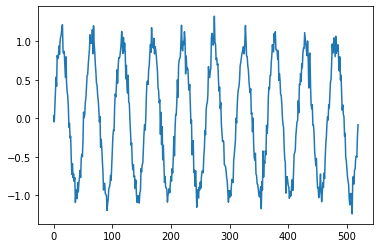

In [218]:
def noise(resolution, std, amplitude = 1):
    return np.random.normal(0, std, resolution) * amplitude

resolution = 520
noisy_sin_series = wave(10, resolution, 1) + noise(resolution, 0.1)
plt.plot(noisy_sin_series)
plt.show()

We added a pure random noise with a 0.1 std value. We **can't expect our model having an error value lower than 0.1**, but it must be as close as possible.

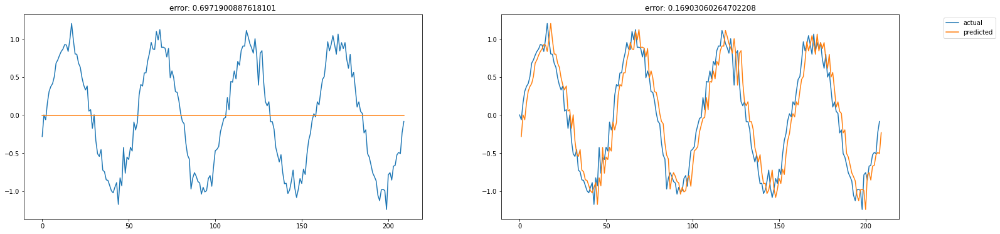

In [238]:
lags = 3
scaled_series = scaler.fit_transform(noisy_sin_series.reshape(-1, 1)).reshape(-1)
lagged_series_df = prepare_lags(scaled_series, lags=lags)
X_train, y_train, X_test, y_test, train_df, test_df = split_test(lagged_series_df, 0.6)

y_test_unscaled = unscale(y_test, scaler)
baseline(y_test_unscaled)

Model: "Simple_MLP_3_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_34 (Dense)            (None, 5)                 20        
                                                                 
 dense_35 (Dense)            (None, 1)                 6         
                                                                 
Total params: 26
Trainable params: 26
Non-trainable params: 0
_________________________________________________________________
errors: [0.14988009956437007, 0.15256052485414845, 0.15260320356217846, 0.15362856271185116, 0.15312822319932692]
error avg: 0.15236012277837502
error std: 0.0012998986516598663


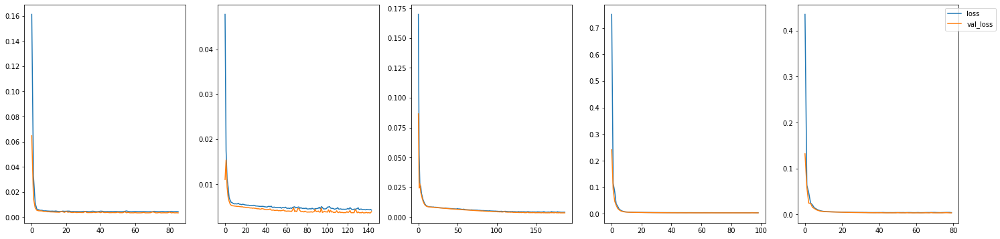

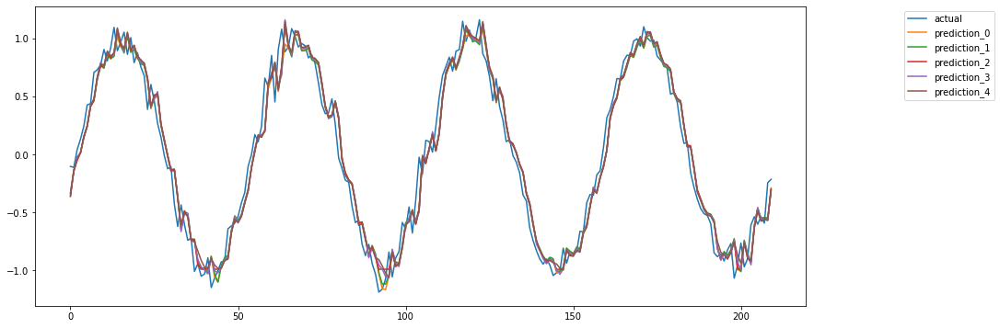

In [39]:
lags3_results = evaluate_model(
    5,
    [
        layers.Dense(5, activation=activations.relu),
        layers.Dense(1, activation=activations.linear)
    ], 
    X_train, y_train, X_test, y_test,
    epochs=200,
    batch_size=32,
    name=f'Simple_MLP_{lags}_lags',
    scaler=scaler,
    early_stop=True,
    learning_rate=0.01,
    verbose=False,
    print_summary=True
)

The model is stable but does not perform any better than the baseline model. Adding noise, reintroduced the shifting problem. That means that the model in not anymore able to discover the underlying sinusoidal pattern.
Let's try to add one more lag.

Model: "Simple_MLP_4_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_36 (Dense)            (None, 5)                 25        
                                                                 
 dense_37 (Dense)            (None, 1)                 6         
                                                                 
Total params: 31
Trainable params: 31
Non-trainable params: 0
_________________________________________________________________
errors: [0.14320651505393447, 0.14345840922307834, 0.14039278622180767, 0.1385032519403743, 0.14101983862926065]
error avg: 0.14131616021369112
error std: 0.0018447520811552091


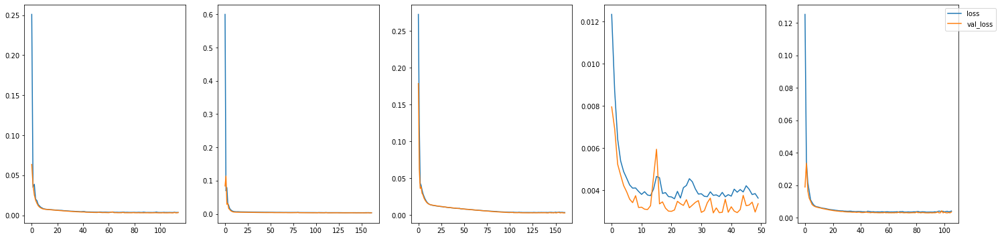

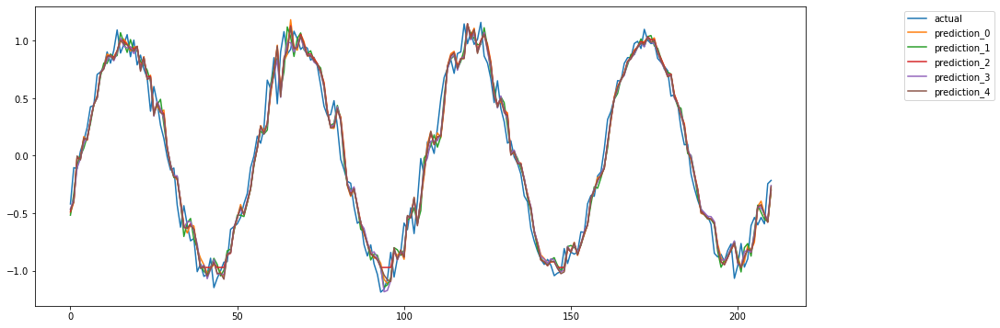

In [40]:
lags=4
lagged_series_df = prepare_lags(scaled_series, lags=lags)
X_train, y_train, X_test, y_test, train_df, test_df = split_test(lagged_series_df, 0.6)

lags4_results = evaluate_model(
    5,
    [
        layers.Dense(5, activation=activations.relu),
        layers.Dense(1, activation=activations.linear)
    ], 
    X_train, y_train, X_test, y_test,
    epochs=200,
    batch_size=32,
    name=f'Simple_MLP_{lags}_lags',
    scaler=scaler,
    early_stop=True,
    learning_rate=0.01,
    verbose=False,
    print_summary=True
)

Now the model is stable and performs better than the baselines, but the average is not that good. Let's see if we are able to improve it by adding more hidden layers.

Model: "MLP_4_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_46 (Dense)            (None, 10)                50        
                                                                 
 dense_47 (Dense)            (None, 100)               1100      
                                                                 
 dense_48 (Dense)            (None, 10)                1010      
                                                                 
 dense_49 (Dense)            (None, 1)                 11        
                                                                 
Total params: 2,171
Trainable params: 2,171
Non-trainable params: 0
_________________________________________________________________
errors: [0.1289423419276896, 0.1395449865922555, 0.13147918113759033, 0.13741844797284639, 0.13831277971462239]
error avg: 0.13513954746900086
error std: 0.0041587094743721865


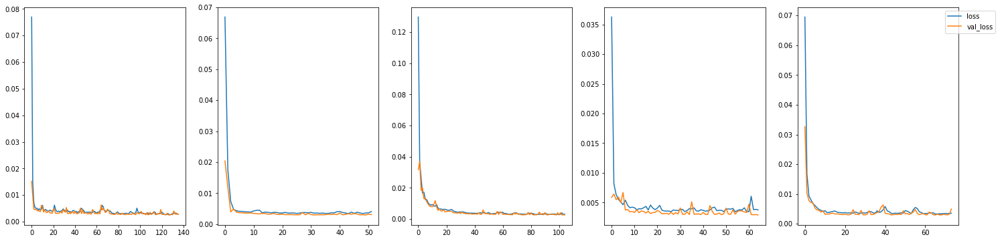

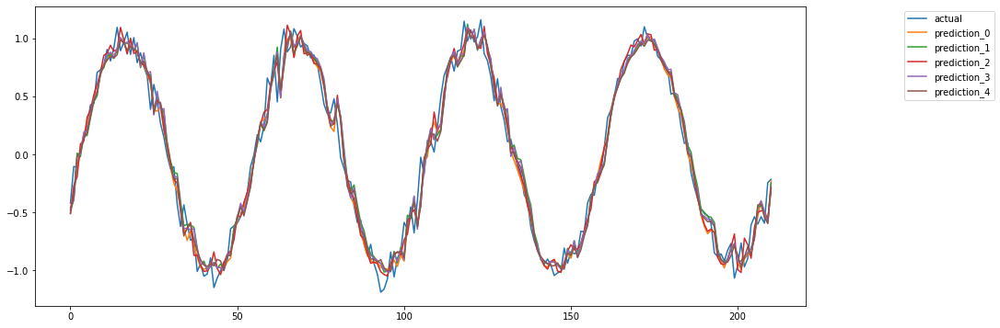

In [43]:
lags4_results_noise_MLP = evaluate_model(
    5,
    [
        layers.Dense(10, activation=activations.relu),
        layers.Dense(100, activation=activations.relu),
        layers.Dense(10, activation=activations.relu),
        layers.Dense(1, activation=activations.linear)
    ], 
    X_train, y_train, X_test, y_test,
    epochs=200,
    batch_size=32,
    name=f'MLP_{lags}_lags',
    scaler=scaler,
    early_stop=True,
    learning_rate=0.01,
    verbose=False,
    print_summary=True
)

We can observe a little improvement but nothing actually satisfying.

What if we introduce more sophisticated models like **Recurrent Neural Networks** and **Convolutional Neural Networks**?

In [47]:
def evaluate_all_models(X_train, y_train, X_test, y_test, scaler, verbose=False, plot=True, print_summary=True, first_hidden_num=10):
    lags = X_train.shape[1]
    result = {}

    result.update(evaluate_model(
        5,
        [
            layers.Dense(first_hidden_num, activation=activations.relu),
            layers.Dense(1, activation=activations.linear)
        ], 
        X_train, y_train, X_test, y_test,
        epochs=200,
        batch_size=32,
        name=f'Simple_MLP_{lags}_lags',
        scaler=scaler,
        early_stop=True,
        learning_rate=0.01,
        verbose=verbose,
        print_plot=plot,
        print_summary=print_summary
    ))

    result.update(evaluate_model(
        5,
        [
            layers.Dense(first_hidden_num, activation=activations.relu),
            layers.Dense(100, activation=activations.relu),
            layers.Dense(10, activation=activations.relu),
            layers.Dense(1, activation=activations.linear)
        ], 
        X_train, y_train, X_test, y_test,
        epochs=200,
        batch_size=32,
        name=f'Deep_MLP_{lags}_lags',
        scaler=scaler,
        early_stop=True,
        learning_rate=0.01,
        verbose=verbose,
        print_plot=plot,
        print_summary=print_summary
    ))

    result.update(evaluate_model(
        5,
        [
            layers.Dense(first_hidden_num, activation=activations.relu),
            layers.Dense(100, activation=activations.relu),
            layers.Dropout(0.1),
            layers.Dense(10, activation=activations.relu),
            layers.Dense(1, activation=activations.linear)
        ], 
        X_train, y_train, X_test, y_test,
        epochs=200,
        batch_size=32,
        name=f'Deep_MLP_Dropout_{lags}_lags',
        scaler=scaler,
        early_stop=True,
        learning_rate=0.01,
        verbose=verbose,
        print_plot=plot,
        print_summary=print_summary
    ))

    result.update(evaluate_model(
        5,
        [
            layers.SimpleRNN(first_hidden_num, activation=activations.tanh),
            layers.Dense(5, activation=activations.tanh),
            layers.Dense(1, activation=activations.linear)
        ], 
        X_train.reshape(X_train.shape[0], X_train.shape[1], 1),
        y_train, 
        X_test.reshape(X_test.shape[0], X_test.shape[1], 1), 
        y_test,
        epochs=200,
        batch_size=32,
        name=f'RNN_{lags}_lags',
        scaler=scaler,
        early_stop=True,
        learning_rate=0.01,
        verbose=verbose,
        print_plot=plot,
        print_summary=print_summary
    ))

    result.update(evaluate_model(
        5,
        [
            layers.SimpleRNN(20, activation=activations.tanh, return_sequences=True),
            layers.SimpleRNN(10, activation=activations.tanh),
            layers.Dense(5, activation=activations.tanh),
            layers.Dense(1, activation=activations.linear)
        ], 
        X_train.reshape(X_train.shape[0], X_train.shape[1], 1), 
        y_train, 
        X_test.reshape(X_test.shape[0], X_test.shape[1], 1), 
        y_test,
        epochs=200,
        batch_size=32,
        name=f'RNN_RNN_{lags}_lags',
        scaler=scaler,
        early_stop=True,
        learning_rate=0.01,
        verbose=verbose,
        print_plot=plot,
        print_summary=print_summary
    ))

    result.update(evaluate_model(
        5,
        [
            layers.LSTM(first_hidden_num, activation=activations.tanh),
            layers.Dense(5, activation=activations.tanh),
            layers.Dense(1, activation=activations.linear)
        ], 
        X_train.reshape(X_train.shape[0], X_train.shape[1], 1), 
        y_train, 
        X_test.reshape(X_test.shape[0], X_test.shape[1], 1), 
        y_test,
        epochs=200,
        batch_size=32,
        name=f'LSTM_{lags}_lags',
        scaler=scaler,
        early_stop=True,
        learning_rate=0.01,
        verbose=verbose,
        print_plot=plot,
        print_summary=print_summary
    ))

    result.update(evaluate_model(
        5,
        [
            layers.GRU(first_hidden_num, activation=activations.tanh),
            layers.Dense(5, activation=activations.tanh),
            layers.Dense(1, activation=activations.linear)
        ], 
        X_train.reshape(X_train.shape[0], X_train.shape[1], 1), 
        y_train, 
        X_test.reshape(X_test.shape[0], X_test.shape[1], 1), 
        y_test,
        epochs=200,
        batch_size=32,
        name=f'GRU_{lags}_lags',
        scaler=scaler,
        early_stop=True,
        learning_rate=0.01,
        verbose=verbose,
        print_plot=plot,
        print_summary=print_summary
    ))

    result.update(evaluate_model(
        5,
        [
            layers.Conv1D(64, kernel_size=math.ceil(lags / 2.), activation=activations.relu),
            layers.Flatten(),
            layers.Dropout(0.1),
            layers.Dense(5, activation=activations.relu),
            layers.Dense(1, activation=activations.linear)
        ], 
        X_train.reshape(X_train.shape[0], X_train.shape[1], 1), 
        y_train, 
        X_test.reshape(X_test.shape[0], X_test.shape[1], 1), 
        y_test,
        epochs=200,
        batch_size=32,
        name=f'CNN_Dropout_{lags}_lags',
        scaler=scaler,
        early_stop=True,
        learning_rate=0.01,
        verbose=verbose,
        print_plot=plot,
        print_summary=print_summary
    ))

    result.update(evaluate_model(
        5,
        [
            layers.Conv1D(64, kernel_size=math.ceil(lags / 2.), activation=activations.relu),
            layers.Flatten(),
            layers.Dense(5, activation=activations.relu),
            layers.Dense(1, activation=activations.linear)
        ], 
        X_train.reshape(X_train.shape[0], X_train.shape[1], 1), 
        y_train, 
        X_test.reshape(X_test.shape[0], X_test.shape[1], 1), 
        y_test,
        epochs=200,
        batch_size=32,
        name=f'CNN_{lags}_lags',
        scaler=scaler,
        early_stop=True,
        learning_rate=0.01,
        verbose=verbose,
        print_plot=plot,
        print_summary=print_summary
    ))
    
    result2 = np.array([[k, v[1], v[2]] for k,v in zip(result.keys(), result.values())])
    return pd.DataFrame({'avg': result2[:, 1], 'std': result2[:, 2]}, index = result2[:, 0])

In [46]:
result_4_lags_all_models = evaluate_all_models(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, scaler=scaler, verbose=False, plot=False, print_summary=False)
result_4_lags_all_models

,avg,std
Simple_MLP_4_lags,0.1399887730876463,0.0014272215459496778
Deep_MLP_4_lags,0.1349578178472531,0.004315359398905849
Deep_MLP_Dropout_4_lags,0.1382183820464934,0.0018480587454606648
RNN_4_lags,0.14161504569385483,0.0006602174119247332
RNN_RNN_4_lags,0.1405078663589933,0.0017478325330584944
LSTM_4_lags,0.1420490933456588,0.0020200544044877713
GRU_4_lags,0.14095772153895653,0.0010140564874161573
CNN_Dropout_4_lags,0.144187657727432,0.002373310184089122
CNN_4_lags,0.3695864604323986,0.28158684541801715


We can observe that neither the RNN models nor the CNN models actually improve the prediction. The deep MLP is still the best performer. We can observe that CNN is more stable with a Droupout level after .

In [49]:
result_4_lags_all_models_20hidden = evaluate_all_models(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, scaler=scaler, verbose=False, plot=False, print_summary=False, first_hidden_num=20)
result_4_lags_all_models_20hidden

,avg,std
Simple_MLP_4_lags,0.1389153853172752,0.0017409174158713938
Deep_MLP_4_lags,0.13325778413319025,0.003367926727414767
Deep_MLP_Dropout_4_lags,0.13686790678377264,0.0035941812188755758
RNN_4_lags,0.1413830538914927,0.0012320055556308614
RNN_RNN_4_lags,0.1423972337750068,0.002351759062417603
LSTM_4_lags,0.14177383879488872,0.000593483923714785
GRU_4_lags,0.14186526796387575,0.0008959176752089505
CNN_Dropout_4_lags,0.14393435311353814,0.001948726572028503
CNN_4_lags,0.13992061622150329,0.0009581613458387148


We don't observe any significant improvement by highering the number of the hidden layers. But what happens if we higher again the number of lags?

In [50]:
def fft(series):
    n = len(series)
    fft = np.fft.fft(series, n)
    PSD = fft * np.conj(fft) / n
    
    return PSD.real

def new_series(series, scaler, lags=10):
    _, ax = plt.subplots(1, 2, figsize=(25,6))
    ax[0].plot(series)
    ax[0].set_title('series')
    ax[1].plot(fft(series))
    ax[1].set_title('fourier components')
    plt.show()

    scaled_series = scaler.fit_transform(series.reshape(-1, 1)).reshape(-1)
    lagged_series_df = prepare_lags(scaled_series, lags=lags)
    X_train, y_train, X_test, y_test, train_df, test_df = split_test(lagged_series_df, 0.6)

    y_test_unscaled = unscale(y_test, scaler)
    
    _, ax = plt.subplots(1, 2, figsize=(25,6))
    evaluate(y_test_unscaled, [y_test_unscaled.mean()] * len(y_test_unscaled), show=False, ax=ax[0])
    evaluate(y_test_unscaled[1:], pd.DataFrame(y_test_unscaled).shift(1).dropna(), show=False, ax=ax[1])
    plt.legend(bbox_to_anchor =(1.25, 1))
    plt.show()
    
    return series, X_train, y_train, X_test, y_test, lagged_series_df

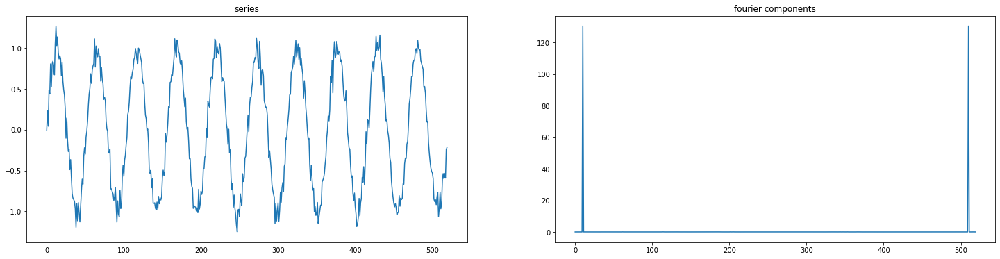

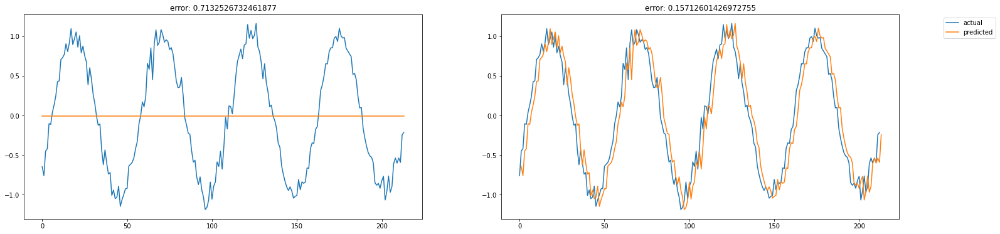

,avg,std
Simple_MLP_10_lags,0.11091631305510741,0.0013546244069350588
Deep_MLP_10_lags,0.11065959386770578,0.0021109216490926646
Deep_MLP_Dropout_10_lags,0.1129726168086507,0.0019920664316463985
RNN_10_lags,0.11150097836502729,0.0018859271265366578
RNN_RNN_10_lags,0.11292713605637568,0.0006492178395344803
LSTM_10_lags,0.11254566220682598,0.0007319152459489057
GRU_10_lags,0.11175885517406296,0.00040448421732515504
CNN_Dropout_10_lags,0.10965771075670797,0.0024374824214963026
CNN_10_lags,0.10835934153347548,0.00047327672304638396


In [51]:
lags=10
noisy_sin_series, X_train, y_train, X_test, y_test, lagged_series_df = new_series(noisy_sin_series, scaler, lags)
result_10_lags_all_models = evaluate_all_models(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, scaler=scaler, verbose=False, plot=False, print_summary=False)
result_10_lags_all_models

Now we observe a significant improvement in all of the models. In case of a CNNs go very close to the target value of 0.1. With 10 lags, all the networks are very good in discovering the underlying pattern.

Let's try to higher the lags one more time to 20. Together we also higher to 20 the number of hidden layers.

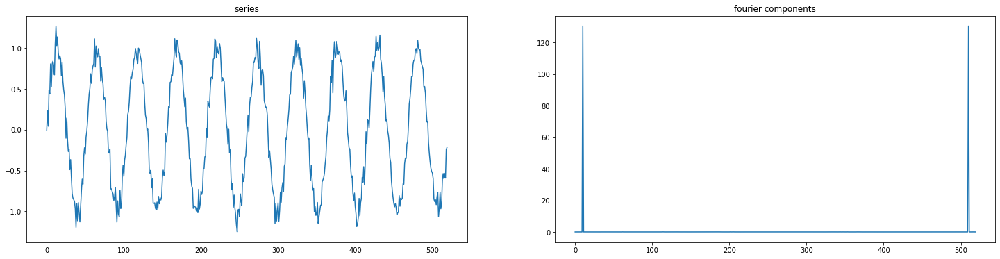

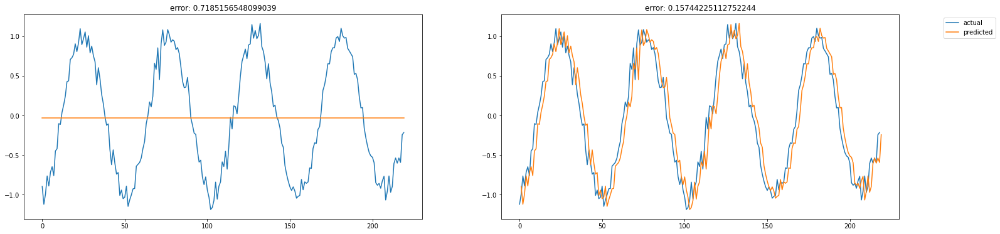

,avg,std
Simple_MLP_20_lags,0.10595279766642329,0.003323093950070988
Deep_MLP_20_lags,0.10610691321182489,0.001121597714005881
Deep_MLP_Dropout_20_lags,0.10650965347054835,0.001046681147319235
RNN_20_lags,0.10535326848640869,0.0010159797466519267
RNN_RNN_20_lags,0.10702420328230924,0.004157284545867823
LSTM_20_lags,0.10493919782264827,0.0018321064259953755
GRU_20_lags,0.10367037545136784,0.0006993398724073732
CNN_Dropout_20_lags,0.3485800728140343,0.3022225236458569
CNN_20_lags,0.10287156038178169,0.0008596155967997812


In [53]:
lags=20
noisy_sin_series, X_train, y_train, X_test, y_test, lagged_series_df = new_series(noisy_sin_series, scaler, lags)
result_20_lags_all_models = evaluate_all_models(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, scaler=scaler, verbose=False, plot=False, print_summary=False, first_hidden_num=20)
result_20_lags_all_models

Even better for all the models, even if it look like the CNN with dropout got a little unstable.

What if the signal changes in time? Let's observe the models behavior on a fading wave

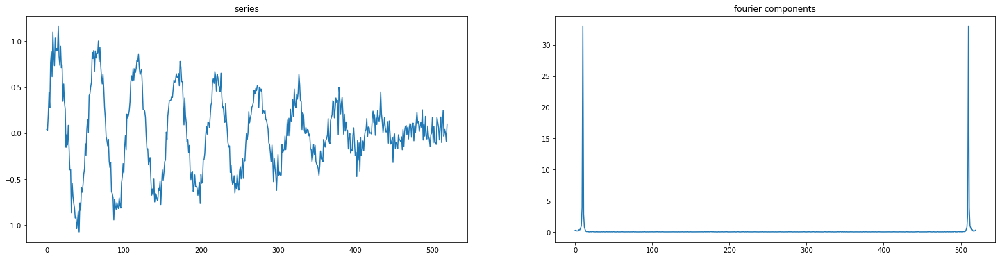

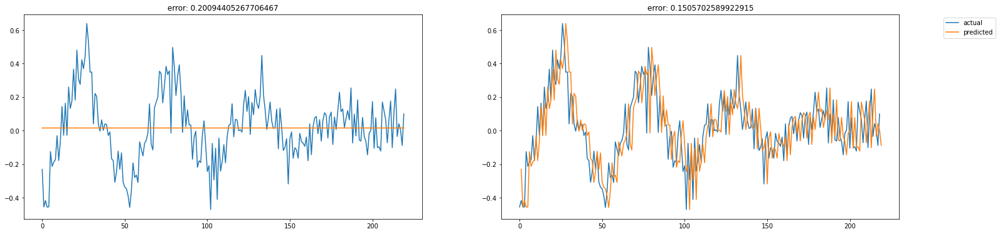

In [54]:
def fading_wave(frequency, resolution, amplitude, fn=np.sin, reverse=True):
    my_wave = wave(frequency, resolution, amplitude, fn)
    fading_amplitude = np.linspace(0, 1, resolution)
    if(reverse):
        fading_amplitude = np.flip(fading_amplitude)
    return my_wave * fading_amplitude

lags=20
resolution = 520
fading_series_noise1, X_train, y_train, X_test, y_test, lagged_series_df = new_series(
    fading_wave(10, resolution, 1) + noise(resolution, 0.1),
    scaler, 
    lags=lags)

In [56]:
fading_result_20_lags_all_models = evaluate_all_models(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, scaler=scaler, verbose=False, plot=False, print_summary=False, first_hidden_num=20)
fading_result_20_lags_all_models

,avg,std
Simple_MLP_20_lags,0.11523316985902692,0.000660289102626104
Deep_MLP_20_lags,0.11805245769999315,0.00346394744596963
Deep_MLP_Dropout_20_lags,0.11826489953877486,0.0009346058879373812
RNN_20_lags,0.11868423356246256,0.001256810969200793
RNN_RNN_20_lags,0.12344513261433745,0.005152510766044715
LSTM_20_lags,0.11668541698718497,0.0009104254505108192
GRU_20_lags,0.11501759978698248,0.0006875674241767176
CNN_Dropout_20_lags,0.11440749221272908,0.0003451351203784371
CNN_20_lags,0.11398905752297343,0.0010629824063869023


CNN are the best performers in this case.

We observed the models performing on simple sinusoidal functions with some noise. Does anything changes when the series gets more complex?
Let's add some other waves and a trend.

In [57]:
def trend(length, c1 = 1.0, c2 = 0.0, amplitude = 1.0):
    xs = np.linspace(0, 1, length)
    ys = 1.0 / (1 + np.exp(-c1 * (xs - c2)))
    return ys * amplitude

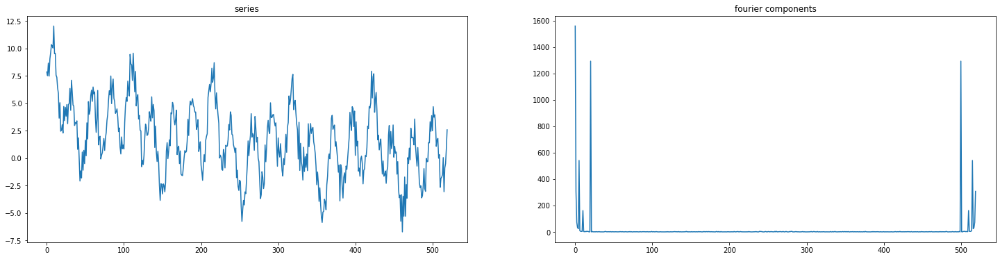

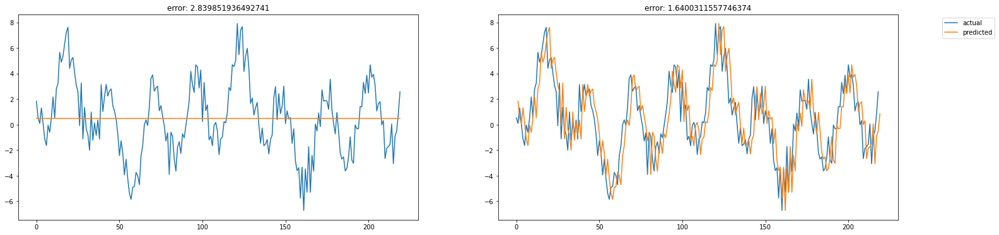

In [74]:
resolution = 520
complex_series_noise1, X_train, y_train, X_test, y_test, lagged_series_df = new_series(
    trend(resolution, -4, 0, 10) +
    wave(10, resolution, 1) + 
    wave(20, resolution, 3) + 
    wave(5, resolution, 2, np.cos) + 
    noise(resolution, 1),
    scaler, 
    lags=lags)

In [75]:
complex_result_20_lags_all_models = evaluate_all_models(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, scaler=scaler, verbose=False, plot=False, print_summary=False, first_hidden_num=20)
complex_result_20_lags_all_models

,avg,std
Simple_MLP_20_lags,1.295149469605385,0.011699081688003248
Deep_MLP_20_lags,1.291091684118314,0.027928664435971595
Deep_MLP_Dropout_20_lags,1.3175432080193774,0.03613856607714803
RNN_20_lags,1.2789730256842315,0.01287916096656624
RNN_RNN_20_lags,1.279893054887665,0.01937467819966387
LSTM_20_lags,1.2581676085995412,0.0020302206655486185
GRU_20_lags,1.2886656173797568,0.0058250482617070685
CNN_Dropout_20_lags,1.281008451538614,0.01956568442379314
CNN_20_lags,1.2505918658296982,0.007719166207386373


Looks like LSTM emerges here as one of the best models.

Let's now experiment, highering the noise level.

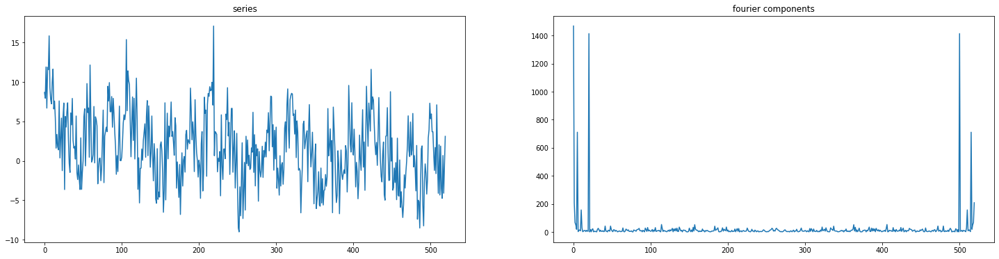

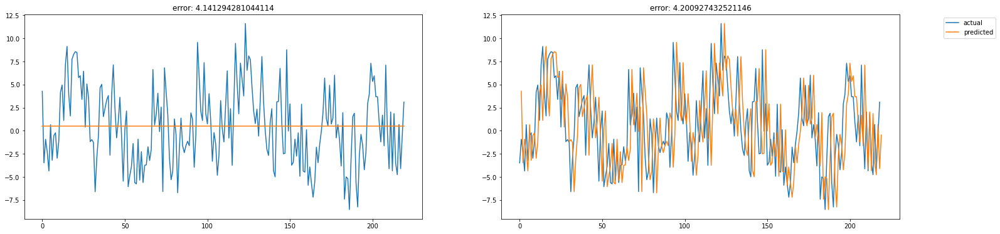

In [77]:
complex_series_noise3, X_train, y_train, X_test, y_test, lagged_series_df = new_series(
    trend(resolution, -4, 0, 10) +
    wave(10, resolution, 1) + 
    wave(20, resolution, 3) + 
    wave(5, resolution, 2, np.cos) + 
    noise(resolution, 3),
    scaler, 
    lags=lags)

In [78]:
complex_noise3_result_20_lags_all_models = evaluate_all_models(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, scaler=scaler, verbose=False, plot=False, print_summary=False, first_hidden_num=20)
complex_noise3_result_20_lags_all_models

,avg,std
Simple_MLP_20_lags,3.541543471340211,0.04028293073270874
Deep_MLP_20_lags,3.5276389831630452,0.06315189048903787
Deep_MLP_Dropout_20_lags,3.5039878727559426,0.009593573766285014
RNN_20_lags,3.5090244525210266,0.04887275974598858
RNN_RNN_20_lags,3.551792490008798,0.07630050599311781
LSTM_20_lags,3.450983696731773,0.00856807476380079
GRU_20_lags,3.488745136681177,0.007498032502509577
CNN_Dropout_20_lags,3.540002194397881,0.01260908662414526
CNN_20_lags,3.527299222777227,0.01346475947925079


LSTM now does the best with this noisy signal.

How do the models behave if we insert 2 fading waves signals hidden in the middel of the others?

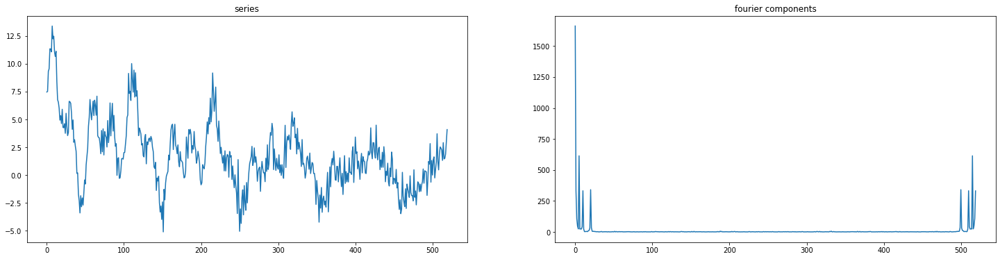

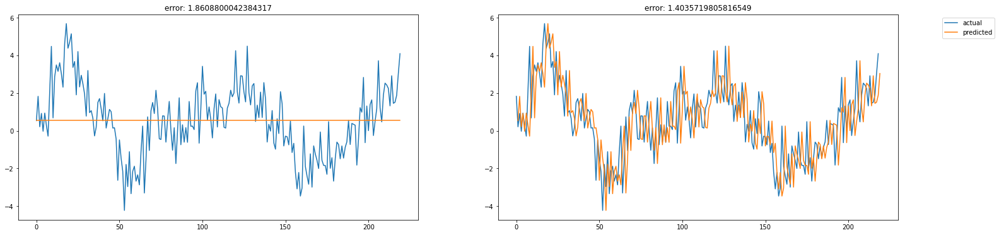

In [88]:
complex_fasing_series_noise3, X_train, y_train, X_test, y_test, lagged_series_df = new_series(
    trend(resolution, -4, 0, 10) +
    fading_wave(20, resolution, 3, reverse = True) + 
    fading_wave(10, resolution, 3) + 
    wave(5, resolution, 2, np.cos) + 
    noise(resolution, 1),
    scaler, 
    lags=lags)

In [89]:
fading_complex_noise1_result_20_lags_all_models = evaluate_all_models(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, scaler=scaler, verbose=False, plot=False, print_summary=False, first_hidden_num=20)
fading_complex_noise1_result_20_lags_all_models

,avg,std
Simple_MLP_20_lags,1.192102294427137,0.022899616890388427
Deep_MLP_20_lags,1.2240014757043265,0.031504622026285886
Deep_MLP_Dropout_20_lags,1.1898517490076057,0.008304948111188044
RNN_20_lags,1.2231313120248024,0.01901678738636899
RNN_RNN_20_lags,1.226169784399279,0.02368588304616646
LSTM_20_lags,1.1659442323008566,0.009658644830959007
GRU_20_lags,1.209123135958956,0.012179385665464736
CNN_Dropout_20_lags,1.1623292169799355,0.005469871418651322
CNN_20_lags,1.1743454459466813,0.007184959098761551


Again CNNs and LSTM does the best result. It is interesting to notice that even the simple MLP is quite good.

Looking at the results, we can say that all the networks are quite good in discovering the underlying patterns of the signals. Anyway, if we have a look at the graphic of the fourier components, the signal looks a bit artifical. The main wave components presents spikes that are too clear.

Let's try to mimic a more realistic signal, with more waves of similar magnitude.

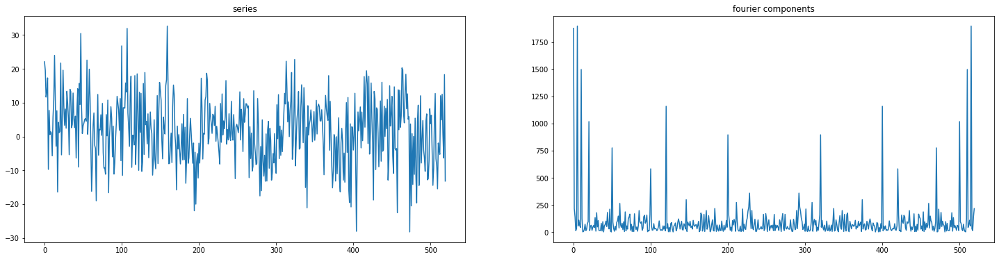

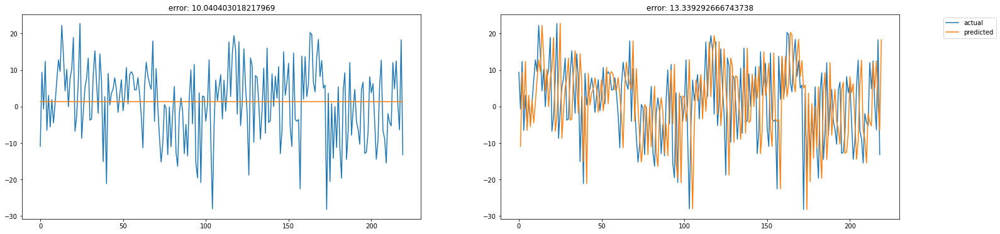

In [90]:
resolution = 520
realistic_series, X_train, y_train, X_test, y_test, lagged_series_df = new_series(
    trend(resolution, -4, 0, 10) +
    wave(10, resolution, 3, np.cos) + 
    wave(20, resolution, 2, np.cos) +
    wave(5, resolution, 2.5, np.sin) + 
    wave(200, resolution, 3, np.sin) + 
    wave(400, resolution, 2, np.sin) + 
    wave(100, resolution, 2, np.sin) + 
    wave(50, resolution, 3, np.sin) +
    noise(resolution, 8),
    scaler, 
    lags=lags)

In [91]:
realistic_result_20_lags_all_models = evaluate_all_models(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, scaler=scaler, verbose=False, plot=False, print_summary=False, first_hidden_num=20)
realistic_result_20_lags_all_models

,avg,std
Simple_MLP_20_lags,10.228878686389228,0.05176475739255022
Deep_MLP_20_lags,10.030187499384422,0.029844148674210626
Deep_MLP_Dropout_20_lags,9.967162772123567,0.019507562485589058
RNN_20_lags,10.007126235952454,0.09104628682146446
RNN_RNN_20_lags,9.979227841524914,0.041811020436159176
LSTM_20_lags,9.817239116272706,0.016588119690362262
GRU_20_lags,9.82599048600709,0.01042822085827079
CNN_Dropout_20_lags,9.965712366701862,0.046247989648786604
CNN_20_lags,10.029208612706281,0.029005608653454834


Here LSTM does the best, but no model present anything actually satisfying. Let's try to lower the noise.

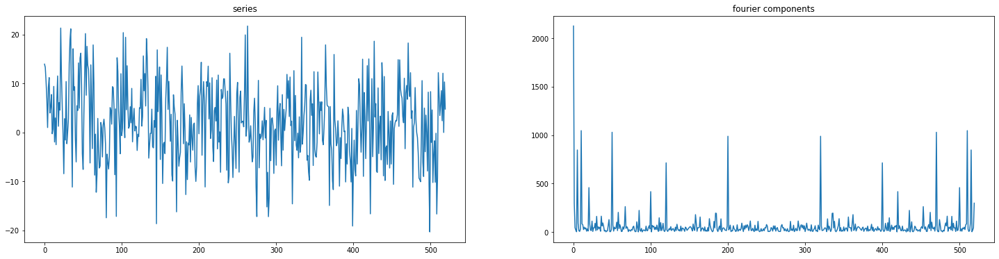

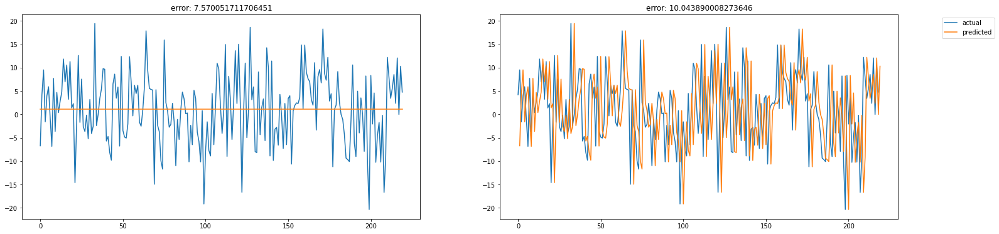

In [103]:
resolution = 520
realistic_series_noise6, X_train, y_train, X_test, y_test, lagged_series_df = new_series(
    trend(resolution, -4, 0, 10) +
    wave(10, resolution, 3, np.cos) + 
    wave(20, resolution, 2, np.cos) +
    wave(5, resolution, 2.5, np.sin) + 
    wave(200, resolution, 3, np.sin) + 
    wave(400, resolution, 2, np.sin) + 
    wave(100, resolution, 2, np.sin) + 
    wave(50, resolution, 3, np.sin) +
    noise(resolution, 6),
    scaler, 
    lags=lags)

In [104]:
realistic_noise6_result_20_lags_all_models = evaluate_all_models(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, scaler=scaler, verbose=False, plot=False, print_summary=False, first_hidden_num=20)
realistic_noise6_result_20_lags_all_models

,avg,std
Simple_MLP_20_lags,7.33289618140698,0.08248293960510775
Deep_MLP_20_lags,7.277963446794994,0.04086096483427343
Deep_MLP_Dropout_20_lags,7.300446009155564,0.0680756604677384
RNN_20_lags,7.355299202023454,0.06708538593882676
RNN_RNN_20_lags,7.338908785442625,0.056394799366320754
LSTM_20_lags,7.45313518670712,0.006881365255085715
GRU_20_lags,7.478250906788499,0.012062667954860837
CNN_Dropout_20_lags,7.264464258678624,0.05417131037994623
CNN_20_lags,7.272853870778843,0.03495130591526816


Now CNNs wins, but we are still very far from the target noise value.

Up to now we feed the networks only with values coming from the series itself. Does the prediction would improve if we try to include some aggregated information coming from the past of the series?

For example, what if we introduce the average values of the previous 4 lags, the previous 12 lags and the same aggregations, but 48 lags before

(0.29555771330628827, 24)

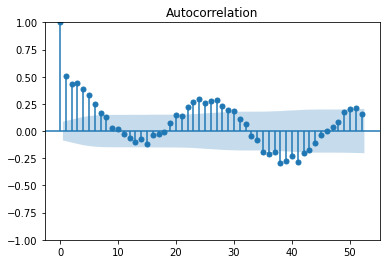

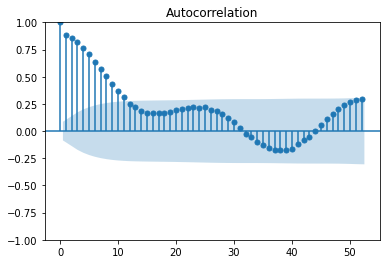

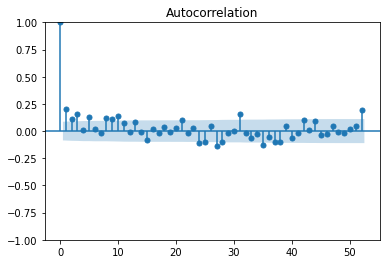

In [138]:
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.tsa.stattools import acf

plot_acf(complex_series_noise3, lags=52)
plot_acf(complex_fasing_series_noise3, lags=52)
plot_acf(realistic_series_noise6, lags=52)

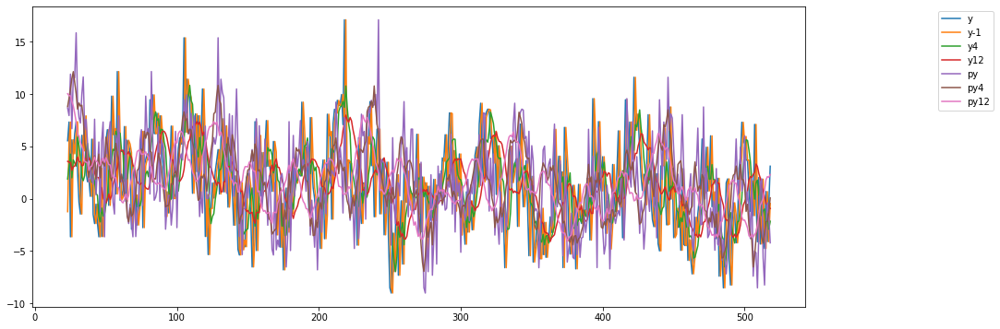

In [178]:
def prepare_data_multivariate(series: np.array):
    series = pd.Series(series)
    series_averages_df = pd.DataFrame({'y-1':series})
    series_averages_df['y4'] = series.rolling(window = 4).mean()
    series_averages_df['y12'] = series.rolling(window = 12).mean()
    
    acf_array = acf(series, nlags=52)
    shift_value = (acf_array[12:].argmax() + 12) - 1
    
    series_averages_df['py'] = series.shift(shift_value)
    series_averages_df['py4'] = series_averages_df['y4'].shift(shift_value - 3)
    series_averages_df['py12'] = series_averages_df['y12'].shift(shift_value - 11)
    series_averages_df['y'] = series.shift(-1)
    
    return series_averages_df.dropna()

multi_series: pd.DataFrame = prepare_data_multivariate(complex_series_noise3)
multi_series.head(10)

plot([multi_series['y'], multi_series['y-1'], multi_series['y4'], multi_series['y12'], multi_series['py'], multi_series['py4'], multi_series['py12']], labels=['y','y-1','y4','y12','py','py4','py12'])
plot_px([multi_series['y'], multi_series['y-1'], multi_series['y4'], multi_series['y12'], multi_series['py'], multi_series['py4'], multi_series['py12']], labels=['y','y-1','y4','y12','py','py4','py12'])

In [98]:
def prepare_lags_multivariate(series: pd.DataFrame, lags: int):
    range_right = lags + 1
    lags_data = np.array([series.shift(range_right - i) for i in range(1, range_right)])
    lags_data = lags_data.transpose(1, 0, 2)
    lags_data = np.array(list(filter(lambda x: not np.isnan(x).any(), lags_data)))
    
    return lags_data, lags_data[:, :, :-1], lags_data[:, :, -1]

def split_test_multivariate(series: np.array, split_percentage=0.8):
    train_len = int(len(series) * split_percentage)
    train = series[:train_len]
    test = series[train_len:]
    
    return train[:, :, :-1], train[:, -1, -1], test[:, :, :-1], test[:, -1, -1], train, test

def new_series_multivariate(series: np.array, scaler: MinMaxScaler, lags=10):
    _, ax = plt.subplots(1, 2, figsize=(25,6))
    ax[0].plot(series)
    ax[0].set_title('series')
    ax[1].plot(fft(series))
    ax[1].set_title('fourier components')
    plt.show()

    scaled_series = scaler.fit_transform(series.reshape(-1, 1)).reshape(-1)
    multivariate_series = prepare_data_multivariate(scaled_series)
    lagged_series, _, _ = prepare_lags_multivariate(multivariate_series, lags=lags)
    X_train, y_train, X_test, y_test, train_df, test_df = split_test_multivariate(lagged_series, 0.6)

    y_test_unscaled = unscale(y_test, scaler)
    
    _, ax = plt.subplots(1, 2, figsize=(25,6))
    evaluate(y_test_unscaled, [y_test_unscaled.mean()] * len(y_test_unscaled), show=False, ax=ax[0])
    evaluate(y_test_unscaled[1:], pd.DataFrame(y_test_unscaled).shift(1).dropna(), show=False, ax=ax[1])
    plt.legend(bbox_to_anchor =(1.25, 1))
    plt.show()
    
    return series, X_train, y_train, X_test, y_test, lagged_series_df

def evaluate_all_models_multivariate(X_train, y_train, X_test, y_test, scaler, verbose=False, plot=True, print_summary=True, first_hidden_num=20):
    lags = X_train.shape[1]
    result = {}

    result.update(evaluate_model(
        5,
        [
            layers.Dense(first_hidden_num, activation=activations.relu),
            layers.Dense(1, activation=activations.linear)
        ], 
        X_train.reshape(X_train.shape[0], X_train.shape[1] * X_train.shape[2]), 
        y_train, 
        X_test.reshape(X_test.shape[0], X_test.shape[1] * X_test.shape[2]), 
        y_test,
        epochs=200,
        batch_size=32,
        name=f'Simple_MLP_{lags}_lags',
        scaler=scaler,
        early_stop=True,
        learning_rate=0.005,
        verbose=verbose,
        print_plot=plot,
        print_summary=print_summary
    ))

    result.update(evaluate_model(
        5,
        [
            layers.Dense(first_hidden_num, activation=activations.relu),
            layers.Dense(100, activation=activations.relu),
            layers.Dense(10, activation=activations.relu),
            layers.Dense(1, activation=activations.linear)
        ], 
        X_train.reshape(X_train.shape[0], X_train.shape[1] * X_train.shape[2]), 
        y_train, 
        X_test.reshape(X_test.shape[0], X_test.shape[1] * X_test.shape[2]), 
        y_test,
        epochs=200,
        batch_size=32,
        name=f'Deep_MLP_{lags}_lags',
        scaler=scaler,
        early_stop=True,
        learning_rate=0.005,
        verbose=verbose,
        print_plot=plot,
        print_summary=print_summary
    ))

    result.update(evaluate_model(
        5,
        [
            layers.Dense(first_hidden_num, activation=activations.relu),
            layers.Dense(100, activation=activations.relu),
            layers.Dropout(0.1),
            layers.Dense(10, activation=activations.relu),
            layers.Dense(1, activation=activations.linear)
        ], 
        X_train.reshape(X_train.shape[0], X_train.shape[1] * X_train.shape[2]), 
        y_train, 
        X_test.reshape(X_test.shape[0], X_test.shape[1] * X_test.shape[2]), 
        y_test,
        epochs=200,
        batch_size=32,
        name=f'Deep_MLP_Dropout_{lags}_lags',
        scaler=scaler,
        early_stop=True,
        learning_rate=0.005,
        verbose=verbose,
        print_plot=plot,
        print_summary=print_summary
    ))

    result.update(evaluate_model(
        5,
        [
            layers.SimpleRNN(first_hidden_num, activation=activations.tanh),
            layers.Dense(5, activation=activations.tanh),
            layers.Dense(1, activation=activations.linear)
        ], 
        X_train, y_train, X_test, y_test,
        epochs=200,
        batch_size=32,
        name=f'RNN_{lags}_lags',
        scaler=scaler,
        early_stop=True,
        learning_rate=0.005,
        verbose=verbose,
        print_plot=plot,
        print_summary=print_summary
    ))

    result.update(evaluate_model(
        5,
        [
            layers.SimpleRNN(20, activation=activations.tanh, return_sequences=True),
            layers.SimpleRNN(10, activation=activations.tanh),
            layers.Dense(5, activation=activations.tanh),
            layers.Dense(1, activation=activations.linear)
        ], 
        X_train, y_train, X_test, y_test,
        epochs=200,
        batch_size=32,
        name=f'RNN_RNN_{lags}_lags',
        scaler=scaler,
        early_stop=True,
        learning_rate=0.005,
        verbose=verbose,
        print_plot=plot,
        print_summary=print_summary
    ))

    result.update(evaluate_model(
        5,
        [
            layers.LSTM(first_hidden_num, activation=activations.tanh),
            layers.Dense(5, activation=activations.tanh),
            layers.Dense(1, activation=activations.linear)
        ], 
        X_train, y_train, X_test, y_test,
        epochs=200,
        batch_size=32,
        name=f'LSTM_{lags}_lags',
        scaler=scaler,
        early_stop=True,
        learning_rate=0.005,
        verbose=verbose,
        print_plot=plot,
        print_summary=print_summary
    ))

    result.update(evaluate_model(
        5,
        [
            layers.GRU(first_hidden_num, activation=activations.tanh),
            layers.Dense(5, activation=activations.tanh),
            layers.Dense(1, activation=activations.linear)
        ], 
        X_train, y_train, X_test, y_test,
        epochs=200,
        batch_size=32,
        name=f'GRU_{lags}_lags',
        scaler=scaler,
        early_stop=True,
        learning_rate=0.005,
        verbose=verbose,
        print_plot=plot,
        print_summary=print_summary
    ))

    result.update(evaluate_model(
        5,
        [
            layers.Conv2D(64, kernel_size=(5,3), activation=activations.relu, padding='same'),
            layers.Flatten(),
            layers.Dense(5, activation=activations.relu),
            layers.Dense(1, activation=activations.linear)
        ], 
        X_train.reshape(X_train.shape[0], X_train.shape[1], X_train.shape[2], 1),
        y_train,
        X_test.reshape(X_test.shape[0], X_test.shape[1], X_test.shape[2], 1), 
        y_test,
        epochs=200,
        batch_size=32,
        name=f'CNN_2D_{lags}_lags',
        scaler=scaler,
        early_stop=True,
        learning_rate=0.005,
        verbose=verbose,
        print_plot=plot,
        print_summary=print_summary
    ))
    
    result.update(evaluate_model(
        5,
        [
            layers.Conv2D(64, kernel_size=(5,3), activation=activations.relu, padding='same'),
            layers.Flatten(),
            layers.Dropout(0.1),
            layers.Dense(5, activation=activations.relu),
            layers.Dense(1, activation=activations.linear)
        ],
        X_train.reshape(X_train.shape[0], X_train.shape[1], X_train.shape[2], 1),
        y_train,
        X_test.reshape(X_test.shape[0], X_test.shape[1], X_test.shape[2], 1), 
        y_test,
        epochs=200,
        batch_size=32,
        name=f'Dropout_CNN_2D_{lags}_lags',
        scaler=scaler,
        early_stop=True,
        learning_rate=0.005,
        verbose=verbose,
        print_plot=plot,
        print_summary=print_summary
    ))
    
    result.update(evaluate_model(
        5,
        [
            layers.Conv2D(64, kernel_size=(10,5), input_shape=(X_train.shape[1], X_train.shape[2], 1), activation=activations.relu, padding='same'),
            layers.MaxPooling2D(pool_size=(2,2), strides=[2, 2]),
            layers.Conv2D(64, kernel_size=(5,3), activation=activations.relu),
            layers.Flatten(),
            layers.Dropout(0.1),
            layers.Dense(5, activation=activations.relu),
            layers.Dense(1, activation=activations.linear)
        ],
        X_train.reshape(X_train.shape[0], X_train.shape[1], X_train.shape[2], 1),
        y_train,
        X_test.reshape(X_test.shape[0], X_test.shape[1], X_test.shape[2], 1), 
        y_test,
        epochs=200,
        batch_size=32,
        name=f'Deep_CNN_2D_{lags}_lags',
        scaler=scaler,
        early_stop=True,
        learning_rate=0.005,
        verbose=verbose,
        print_plot=plot,
        print_summary=print_summary
    ))
    
    
    result2 = np.array([[k, v[1], v[2]] for k,v in zip(result.keys(), result.values())])
    return pd.DataFrame({'avg': result2[:, 1], 'std': result2[:, 2]}, index = result2[:, 0])

Look that all the models improves when feeding a multivariate series. The models that benefit the most are the MLP models, with Deep_MLP_Dropout_20_lags that now performs even better then CNN and LSTM.

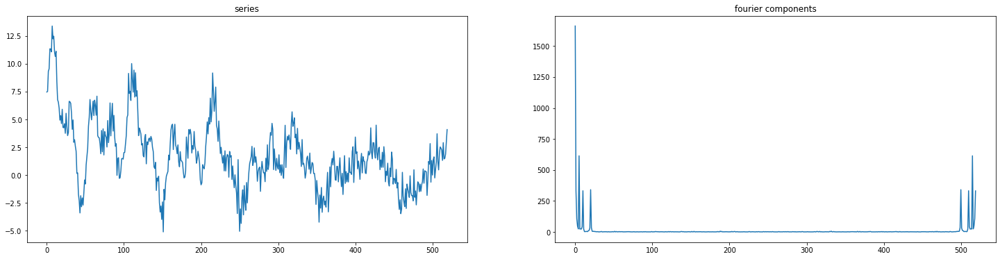

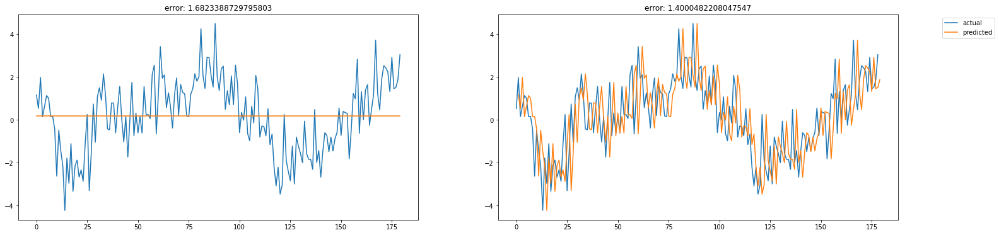

,avg,std
Simple_MLP_20_lags,1.1526391857252274,0.016443125061288793
Deep_MLP_20_lags,1.1244274388292972,0.0095895526689704
Deep_MLP_Dropout_20_lags,1.103532554245419,0.012099142705952427
RNN_20_lags,1.1941979282955717,0.042643894711955545
RNN_RNN_20_lags,1.1765843664456657,0.025544570781062335
LSTM_20_lags,1.1059500151283121,0.016890613674077976
GRU_20_lags,1.1323255443386395,0.018313997079754788
CNN_2D_20_lags,1.1116805242487195,0.0028004672756868285
Dropout_CNN_2D_20_lags,1.2287678496009318,0.22873081575608048
Deep_CNN_2D_20_lags,1.107290513392822,0.008131838629386347


In [175]:
complex_fasing_series_noise3, X_train, y_train, X_test, y_test, lagged_series_df = new_series_multivariate(complex_fasing_series_noise3, scaler, lags)
complex_fasing_series_noise3_result_20_lags_all_models = evaluate_all_models_multivariate(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, scaler=scaler, verbose=False, plot=False, print_summary=False)
complex_fasing_series_noise3_result_20_lags_all_models

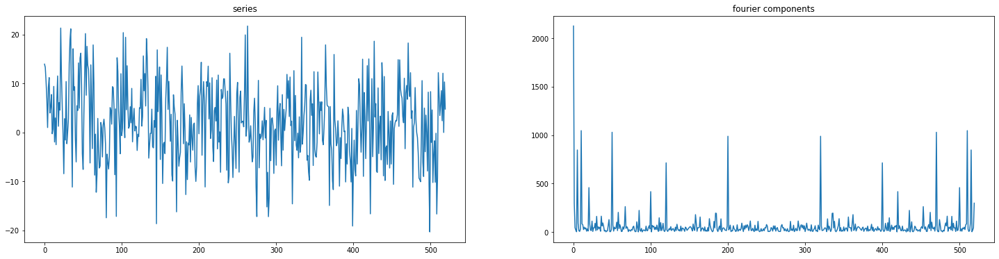

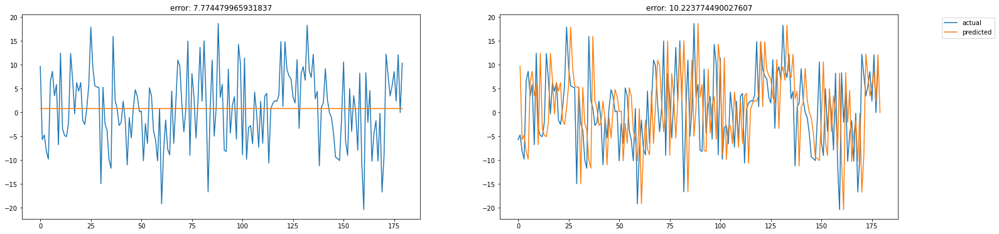

,avg,std
Simple_MLP_20_lags,6.854304295838183,0.03357894142851966
Deep_MLP_20_lags,6.841042804205626,0.1292205969708105
Deep_MLP_Dropout_20_lags,6.881618904934183,0.06844937092604855
RNN_20_lags,7.215753806206666,0.09724538145010297
RNN_RNN_20_lags,7.163482881511844,0.14488197489851581
LSTM_20_lags,7.411152427507275,0.019041373001696008
GRU_20_lags,7.350397773626796,0.06896765539376609
CNN_2D_20_lags,7.4415778093407,0.41622586790781096
Dropout_CNN_2D_20_lags,7.2594103477098795,0.4258669151208323
Deep_CNN_2D_20_lags,7.3274461860095315,0.24435354772351703


In [174]:
realistic_noise6_multivariate, X_train, y_train, X_test, y_test, lagged_series_df = new_series_multivariate(realistic_series_noise6, scaler, lags)
realistic_noise6_multivariate_result_20_lags_all_models = evaluate_all_models_multivariate(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, scaler=scaler, verbose=False, plot=False, print_summary=False)
realistic_noise6_multivariate_result_20_lags_all_models

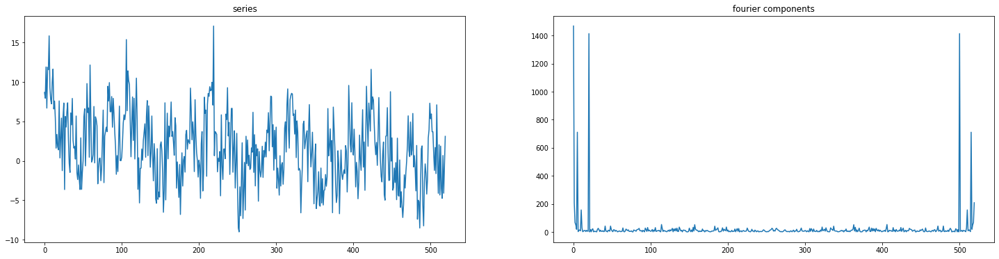

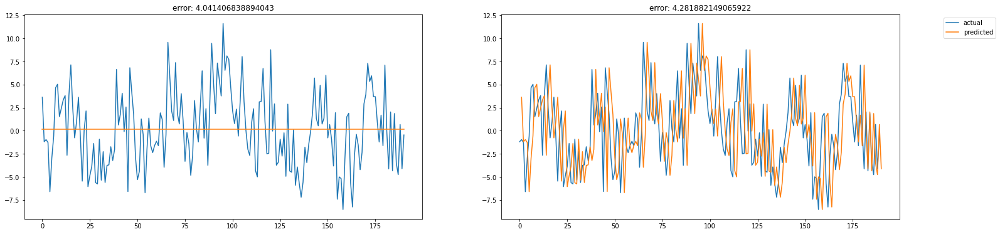

,avg,std
Simple_MLP_20_lags,3.4317864183737194,0.059739107539716306
Deep_MLP_20_lags,3.3681204127439215,0.008501148890203352
Deep_MLP_Dropout_20_lags,3.3909532771312234,0.021995733822824246
RNN_20_lags,3.5346939620755107,0.08488234338015964
RNN_RNN_20_lags,3.5474368759386814,0.08847027274871276
LSTM_20_lags,3.348717069218835,0.01739284919252765
GRU_20_lags,3.382643380797495,0.036825426574106854
CNN_2D_20_lags,3.385803370395891,0.027004754892525958
Dropout_CNN_2D_20_lags,3.3994798371438315,0.02315999753734099
Deep_CNN_2D_20_lags,3.521526621353503,0.2625515258650498


In [173]:
complex_series_noise3_multivariate, X_train, y_train, X_test, y_test, lagged_series_df = new_series_multivariate(complex_series_noise3, scaler, lags)
complex_multivariate_noise3_result_20_lags_all_models = evaluate_all_models_multivariate(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, scaler=scaler, verbose=False, plot=False, print_summary=False)
complex_multivariate_noise3_result_20_lags_all_models

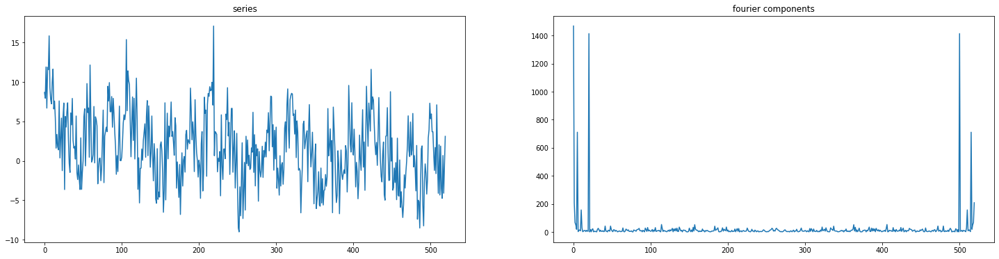

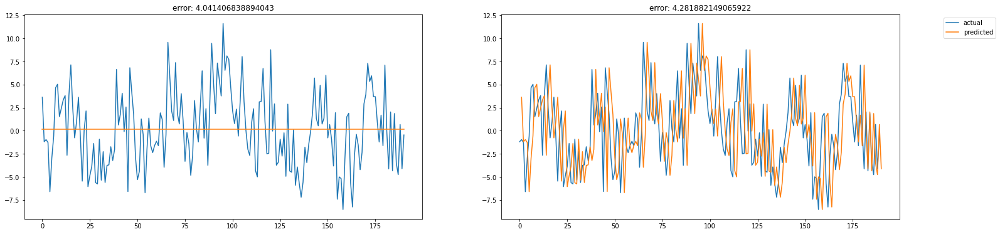

Epoch 1/200
9/9 [==============================] - 2s 81ms/step - loss: 0.1064 - val_loss: 0.0470
Epoch 2/200
9/9 [==============================] - 1s 59ms/step - loss: 0.0285 - val_loss: 0.0220
Epoch 3/200
9/9 [==============================] - 1s 60ms/step - loss: 0.0269 - val_loss: 0.0299
Epoch 4/200
9/9 [==============================] - 1s 59ms/step - loss: 0.0259 - val_loss: 0.0229
Epoch 5/200
9/9 [==============================] - 1s 59ms/step - loss: 0.0241 - val_loss: 0.0267
Epoch 6/200
9/9 [==============================] - 1s 59ms/step - loss: 0.0242 - val_loss: 0.0225
Epoch 7/200
9/9 [==============================] - 1s 59ms/step - loss: 0.0231 - val_loss: 0.0254
Epoch 8/200
9/9 [==============================] - 1s 59ms/step - loss: 0.0217 - val_loss: 0.0231
Epoch 9/200
9/9 [==============================] - 1s 60ms/step - loss: 0.0217 - val_loss: 0.0214
Epoch 10/200
9/9 [==============================] - 1s 60ms/step - loss: 0.0210 - val_loss: 0.0209
Epoch 11/200
9/9 [=

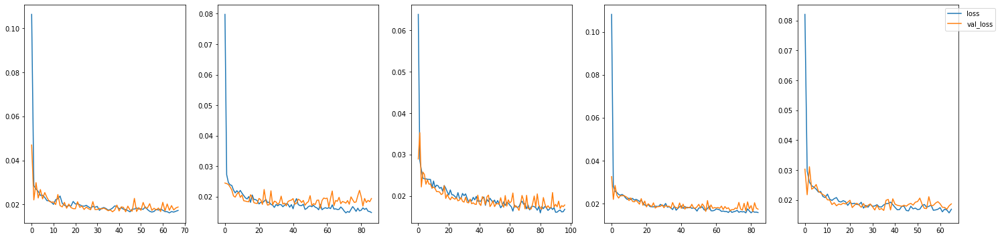

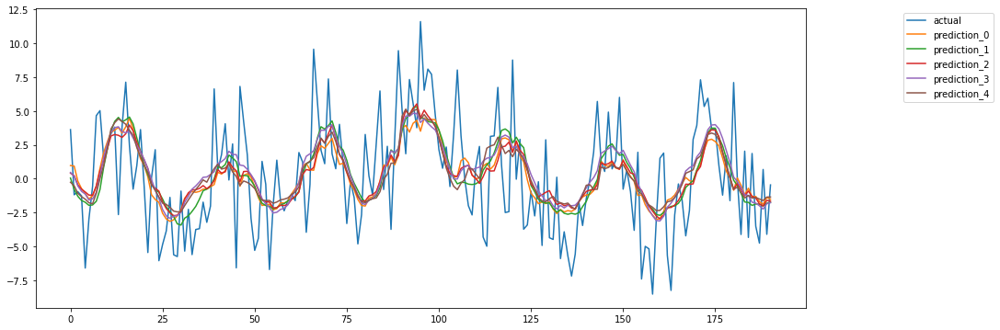

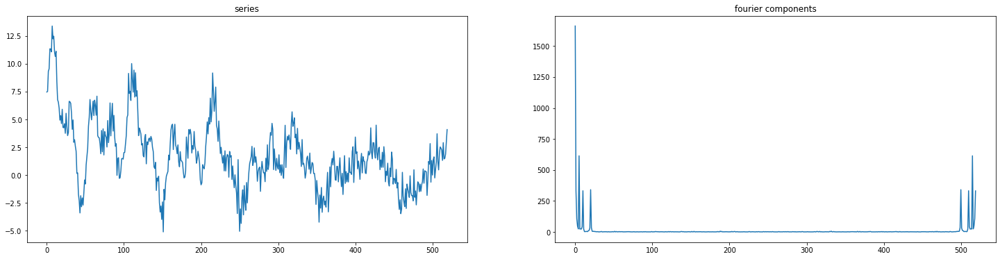

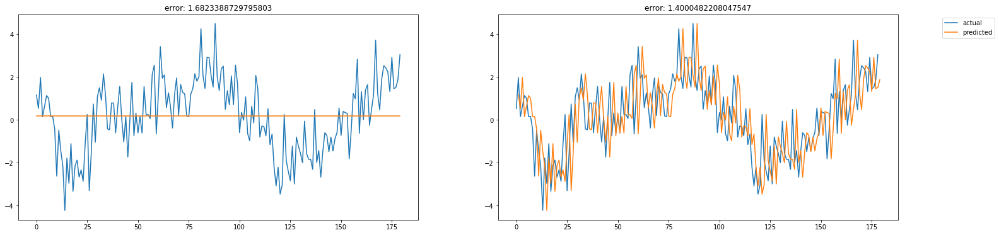

Epoch 1/200
9/9 [==============================] - 2s 79ms/step - loss: 0.0494 - val_loss: 0.0063
Epoch 2/200
9/9 [==============================] - 1s 60ms/step - loss: 0.0205 - val_loss: 0.0166
Epoch 3/200
9/9 [==============================] - 1s 58ms/step - loss: 0.0147 - val_loss: 0.0072
Epoch 4/200
9/9 [==============================] - 1s 60ms/step - loss: 0.0126 - val_loss: 0.0051
Epoch 5/200
9/9 [==============================] - 1s 59ms/step - loss: 0.0100 - val_loss: 0.0044
Epoch 6/200
9/9 [==============================] - 1s 59ms/step - loss: 0.0089 - val_loss: 0.0048
Epoch 7/200
9/9 [==============================] - 1s 70ms/step - loss: 0.0093 - val_loss: 0.0039
Epoch 8/200
9/9 [==============================] - 1s 61ms/step - loss: 0.0081 - val_loss: 0.0038
Epoch 9/200
9/9 [==============================] - 1s 68ms/step - loss: 0.0076 - val_loss: 0.0054
Epoch 10/200
9/9 [==============================] - 1s 63ms/step - loss: 0.0069 - val_loss: 0.0069
Epoch 11/200
9/9 [=

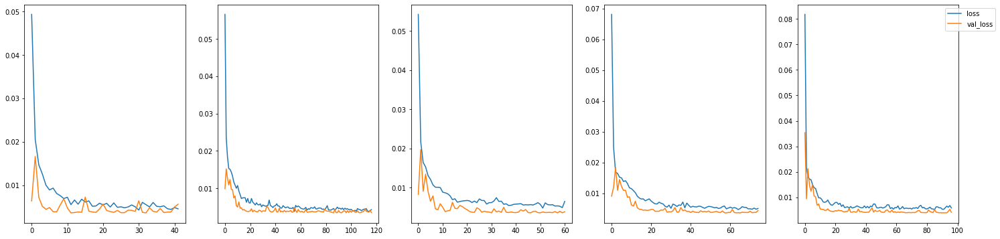

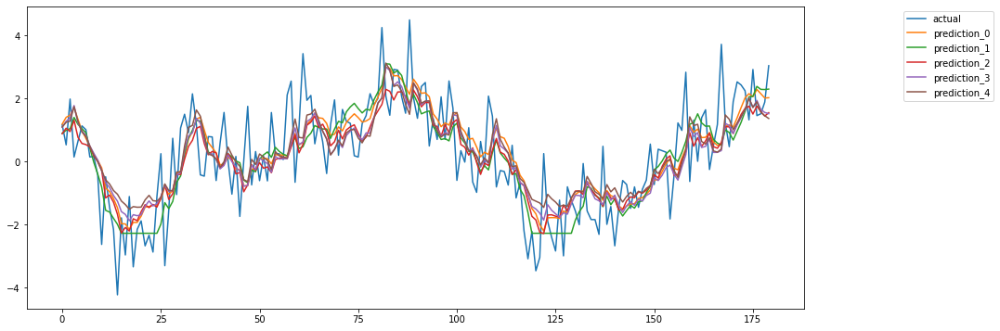

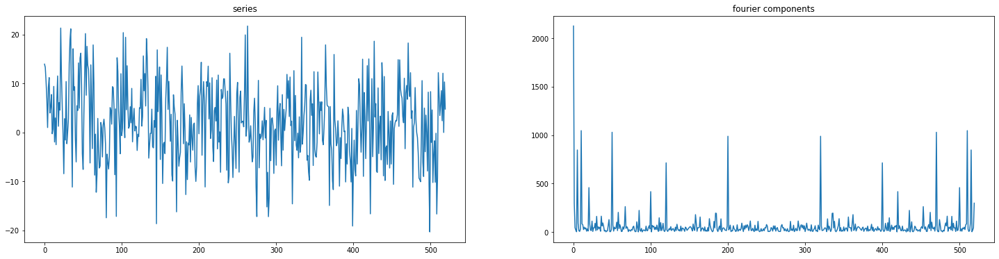

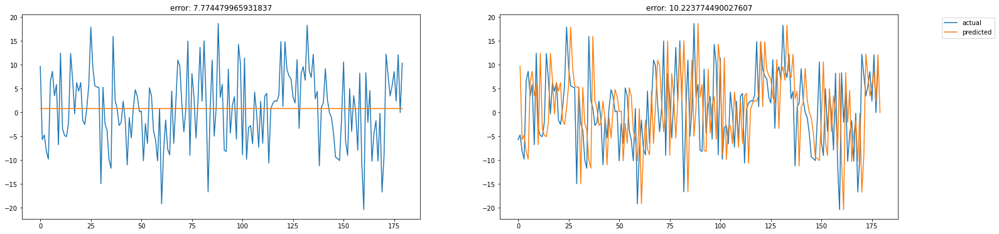

Epoch 1/200
9/9 [==============================] - 2s 73ms/step - loss: 0.1675 - val_loss: 0.0719
Epoch 2/200
9/9 [==============================] - 0s 52ms/step - loss: 0.0776 - val_loss: 0.0503
Epoch 3/200
9/9 [==============================] - 0s 54ms/step - loss: 0.0385 - val_loss: 0.0396
Epoch 4/200
9/9 [==============================] - 0s 53ms/step - loss: 0.0350 - val_loss: 0.0333
Epoch 5/200
9/9 [==============================] - 0s 54ms/step - loss: 0.0315 - val_loss: 0.0328
Epoch 6/200
9/9 [==============================] - 0s 53ms/step - loss: 0.0317 - val_loss: 0.0328
Epoch 7/200
9/9 [==============================] - 0s 53ms/step - loss: 0.0328 - val_loss: 0.0330
Epoch 8/200
9/9 [==============================] - 0s 53ms/step - loss: 0.0331 - val_loss: 0.0331
Epoch 9/200
9/9 [==============================] - 0s 53ms/step - loss: 0.0317 - val_loss: 0.0332
Epoch 10/200
9/9 [==============================] - 0s 53ms/step - loss: 0.0323 - val_loss: 0.0329
Epoch 11/200
9/9 [=

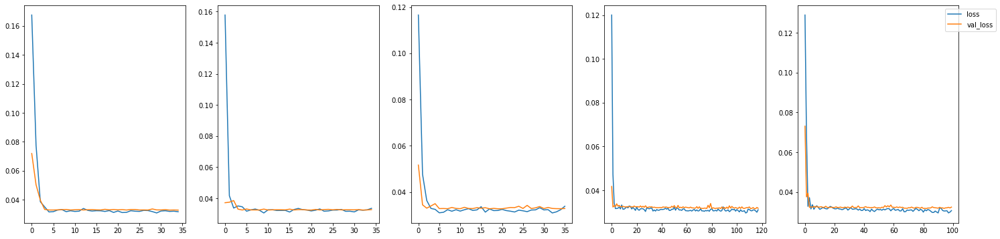

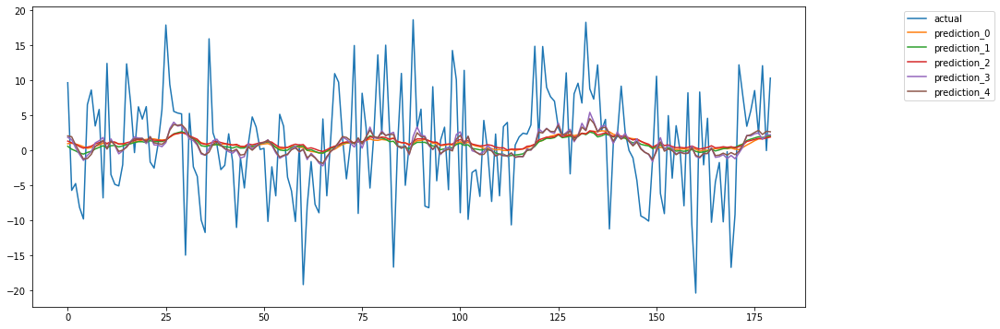

In [187]:

def evaluate_CONV_LSTM(series: np.array, scaler: MinMaxScaler, lags: int):    
    _, X_train, y_train, X_test, y_test, _ = new_series_multivariate(series, scaler, lags)
    evaluate_model(
        5,
        [
            layers.ConvLSTM2D(10, kernel_size=(5,3), activation=activations.relu, padding='same'),
            layers.Flatten(),
            layers.Dropout(0.1),
            layers.Dense(5, activation=activations.relu),
            layers.Dense(1, activation=activations.linear)
        ],
        X_train.reshape(X_train.shape[0], X_train.shape[1], 1, X_train.shape[2], 1),
        y_train,
        X_test.reshape(X_test.shape[0], X_test.shape[1], 1, X_test.shape[2], 1),
        y_test,
        epochs=200,
        batch_size=32,
        name=f'ConvLSTM2D_{lags}_lags',
        scaler=scaler,
        early_stop=True,
        learning_rate=0.01,
        verbose=True,
        print_plot=True,
        print_summary=True
    )
    
lags=20
evaluate_CONV_LSTM(complex_series_noise3, scaler, lags)
evaluate_CONV_LSTM(complex_fasing_series_noise3, scaler, lags)
evaluate_CONV_LSTM(realistic_series_noise6, scaler, lags)


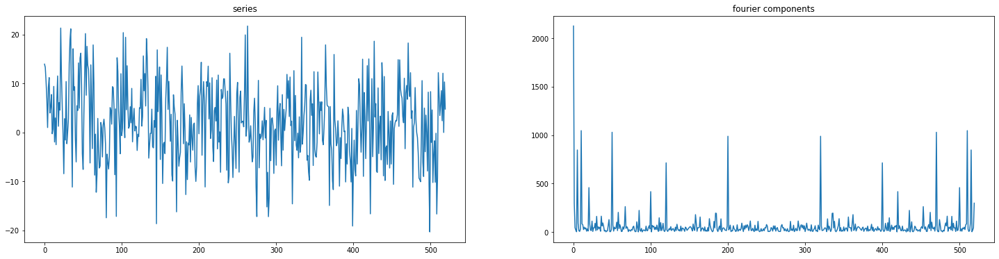

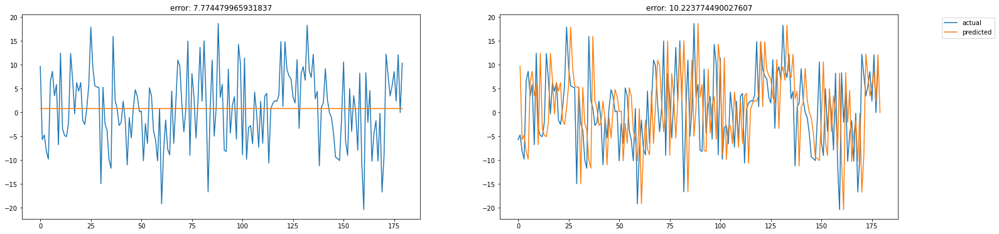

Model: "Simple_MLP_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_830 (Dense)           (None, 20)                2420      
                                                                 
 dense_831 (Dense)           (None, 1)                 21        
                                                                 
Total params: 2,441
Trainable params: 2,441
Non-trainable params: 0
_________________________________________________________________
errors: [6.901006252382797, 6.850209080914582, 6.8308025986539, 6.844835318540221, 6.7800429426447675]
error avg: 6.841379238627253
error std: 0.03877962839059901


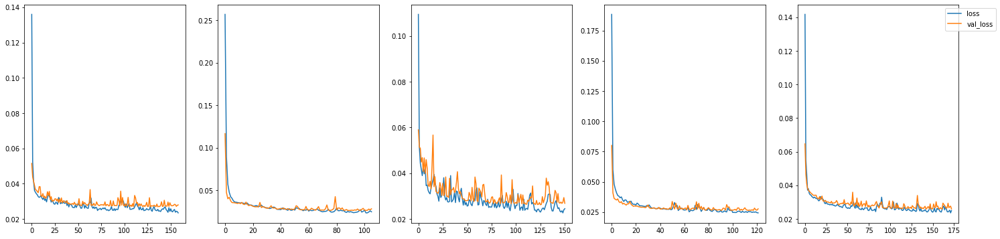

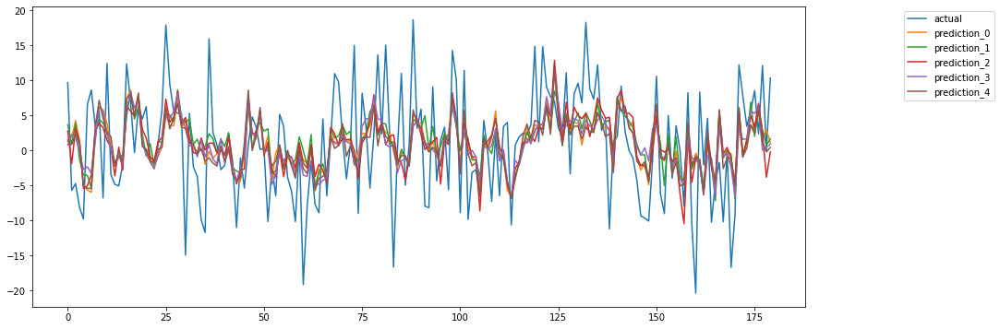

Model: "Deep_MLP_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_832 (Dense)           (None, 20)                2420      
                                                                 
 dense_833 (Dense)           (None, 100)               2100      
                                                                 
 dense_834 (Dense)           (None, 10)                1010      
                                                                 
 dense_835 (Dense)           (None, 1)                 11        
                                                                 
Total params: 5,541
Trainable params: 5,541
Non-trainable params: 0
_________________________________________________________________
errors: [6.931849851672703, 6.637091129786452, 6.839471864883438, 6.842210049618443, 6.830221090687514]
error avg: 6.816168797329711
error std: 0.09681896929159395


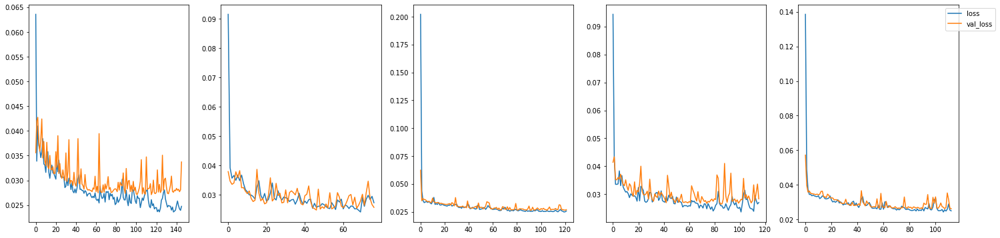

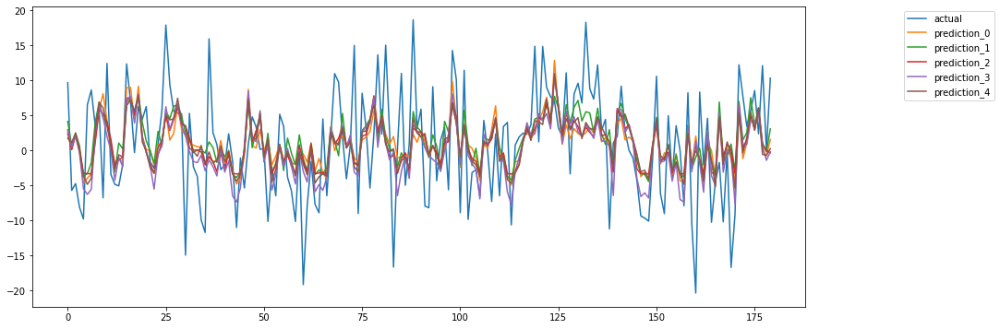

Model: "Deep_MLP_Dropout_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_836 (Dense)           (None, 20)                2420      
                                                                 
 dense_837 (Dense)           (None, 100)               2100      
                                                                 
 dropout_93 (Dropout)        (None, 100)               0         
                                                                 
 dense_838 (Dense)           (None, 10)                1010      
                                                                 
 dense_839 (Dense)           (None, 1)                 11        
                                                                 
Total params: 5,541
Trainable params: 5,541
Non-trainable params: 0
_________________________________________________________________
errors: [6.869949955405859, 6.8947533391

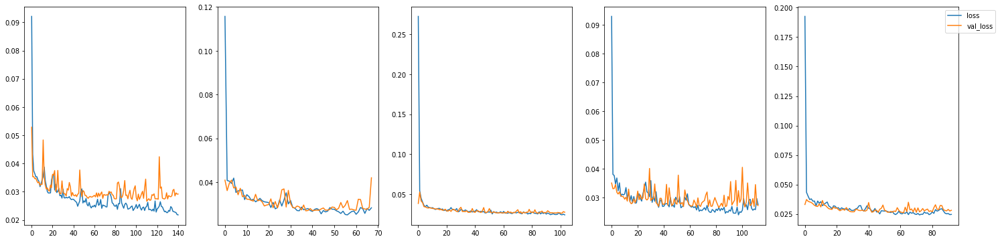

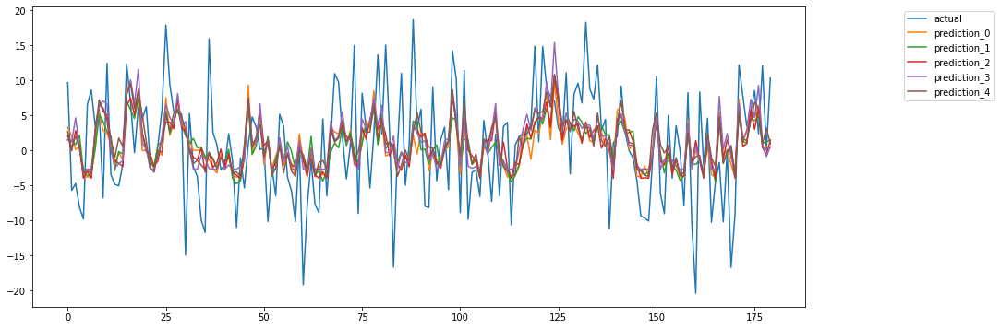

Model: "RNN_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_98 (SimpleRNN)   (None, 20)                540       
                                                                 
 dense_840 (Dense)           (None, 5)                 105       
                                                                 
 dense_841 (Dense)           (None, 1)                 6         
                                                                 
Total params: 651
Trainable params: 651
Non-trainable params: 0
_________________________________________________________________
errors: [7.266806647534962, 7.16084906400231, 7.0883654409657915, 7.347255306737799, 7.242783321997846]
error avg: 7.221211956247743
error std: 0.08913248709584208


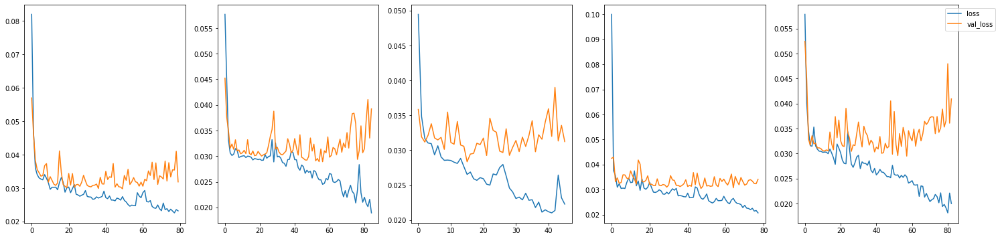

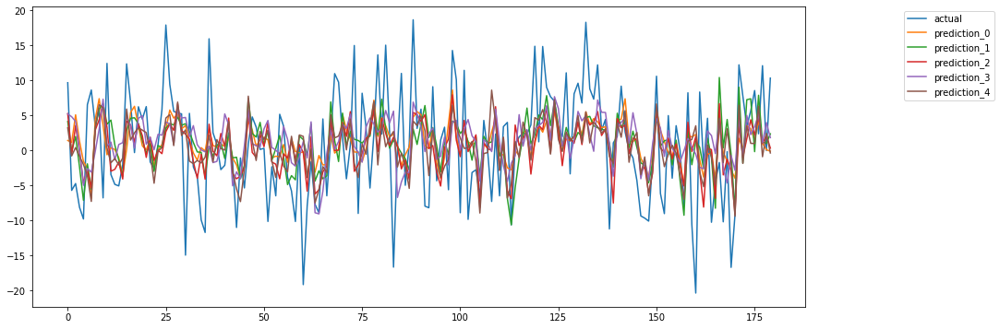

Model: "RNN_RNN_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_99 (SimpleRNN)   (None, 20, 20)            540       
                                                                 
 simple_rnn_100 (SimpleRNN)  (None, 10)                310       
                                                                 
 dense_842 (Dense)           (None, 5)                 55        
                                                                 
 dense_843 (Dense)           (None, 1)                 6         
                                                                 
Total params: 911
Trainable params: 911
Non-trainable params: 0
_________________________________________________________________
errors: [7.273096315314591, 7.152746841987418, 6.97508009123267, 7.513922581282315, 7.220678777088823]
error avg: 7.227104921381164
error std: 0.17519504140247913


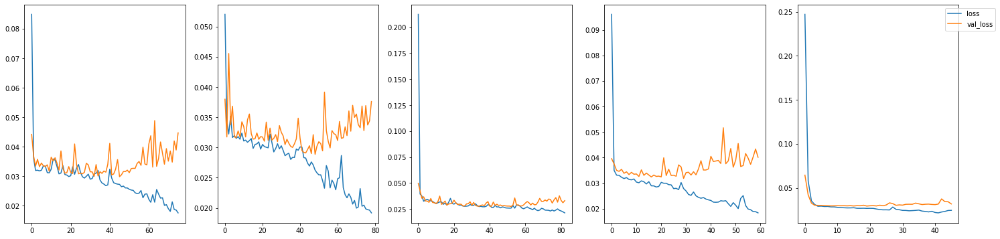

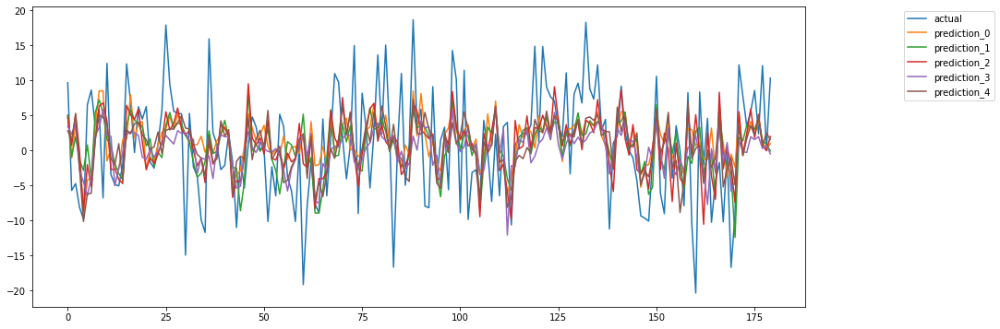

Model: "LSTM_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_31 (LSTM)              (None, 20)                2160      
                                                                 
 dense_844 (Dense)           (None, 5)                 105       
                                                                 
 dense_845 (Dense)           (None, 1)                 6         
                                                                 
Total params: 2,271
Trainable params: 2,271
Non-trainable params: 0
_________________________________________________________________
errors: [7.422651425088274, 7.417900836422948, 7.420330424525711, 7.395601373881932, 7.404433706174766]
error avg: 7.412183553218727
error std: 0.010427501921069324


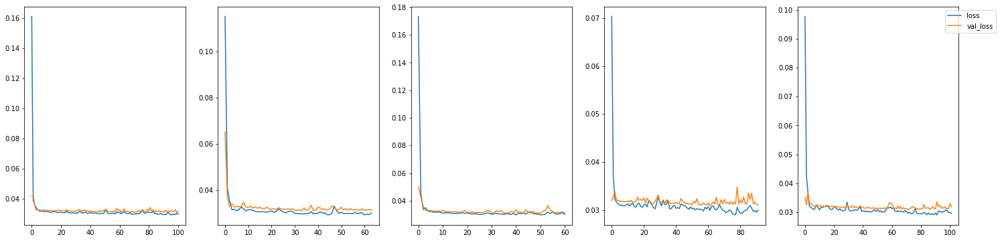

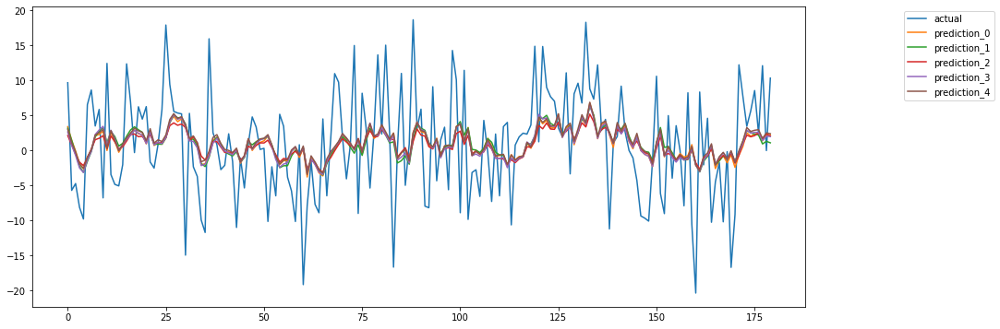

Model: "GRU_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_30 (GRU)                (None, 20)                1680      
                                                                 
 dense_846 (Dense)           (None, 5)                 105       
                                                                 
 dense_847 (Dense)           (None, 1)                 6         
                                                                 
Total params: 1,791
Trainable params: 1,791
Non-trainable params: 0
_________________________________________________________________
errors: [7.380073980683309, 7.3813352765484455, 7.327506871836895, 7.300489741852082, 7.318622172496051]
error avg: 7.3416056086833565
error std: 0.033093169621315734


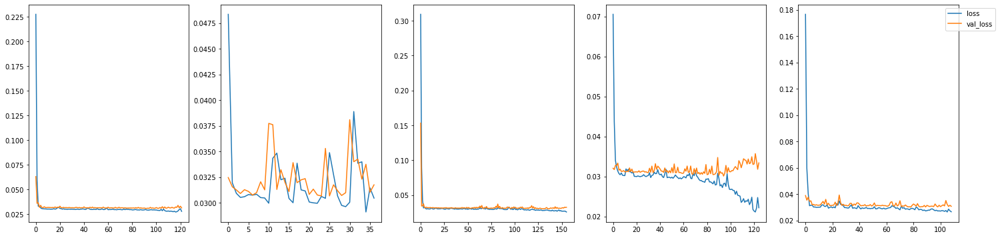

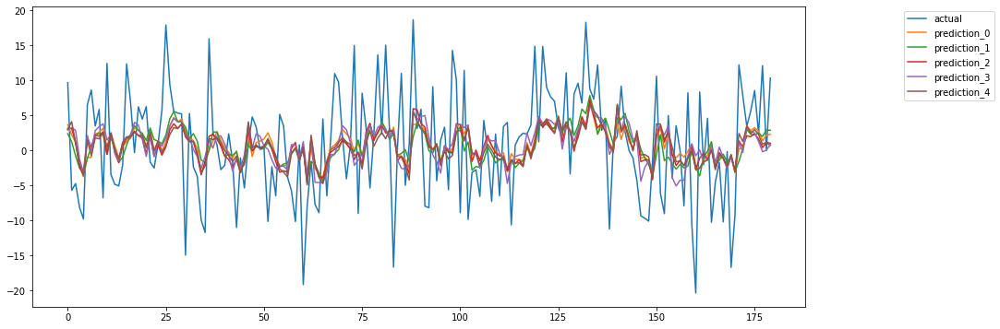

Model: "CNN_2D_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_72 (Conv2D)          (None, 20, 6, 64)         1024      
                                                                 
 flatten_89 (Flatten)        (None, 7680)              0         
                                                                 
 dense_848 (Dense)           (None, 5)                 38405     
                                                                 
 dense_849 (Dense)           (None, 1)                 6         
                                                                 
Total params: 39,435
Trainable params: 39,435
Non-trainable params: 0
_________________________________________________________________
errors: [7.776513960799867, 7.779514201755299, 7.777055918730786, 7.000679561426431, 6.9177796917395415]
error avg: 7.450308666890384
error std: 0.40182169836907594


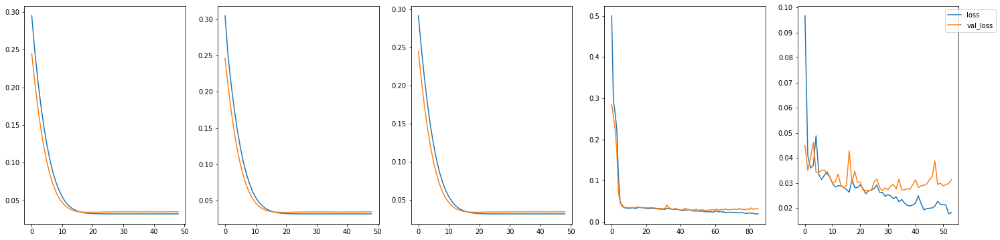

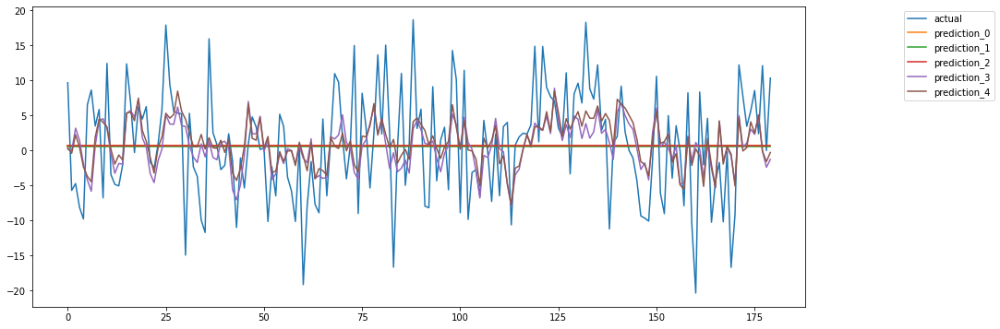

Model: "Dropout_CNN_2D_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_73 (Conv2D)          (None, 20, 6, 64)         1024      
                                                                 
 flatten_90 (Flatten)        (None, 7680)              0         
                                                                 
 dropout_94 (Dropout)        (None, 7680)              0         
                                                                 
 dense_850 (Dense)           (None, 5)                 38405     
                                                                 
 dense_851 (Dense)           (None, 1)                 6         
                                                                 
Total params: 39,435
Trainable params: 39,435
Non-trainable params: 0
_________________________________________________________________
errors: [7.77517431385824, 6.97185757191

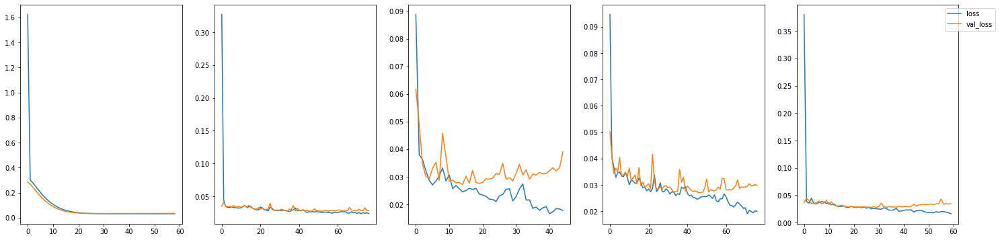

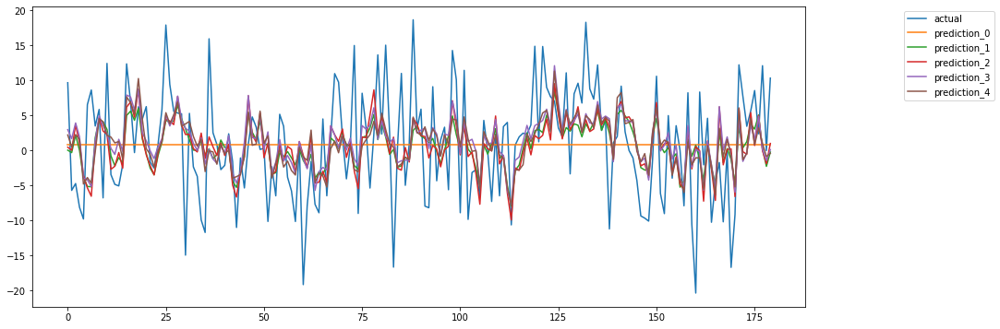

Model: "Deep_CNN_2D_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_74 (Conv2D)          (None, 20, 6, 64)         3264      
                                                                 
 max_pooling2d_18 (MaxPoolin  (None, 10, 3, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_75 (Conv2D)          (None, 6, 1, 64)          61504     
                                                                 
 flatten_91 (Flatten)        (None, 384)               0         
                                                                 
 dropout_95 (Dropout)        (None, 384)               0         
                                                                 
 dense_852 (Dense)           (None, 5)                 1925      
                                               

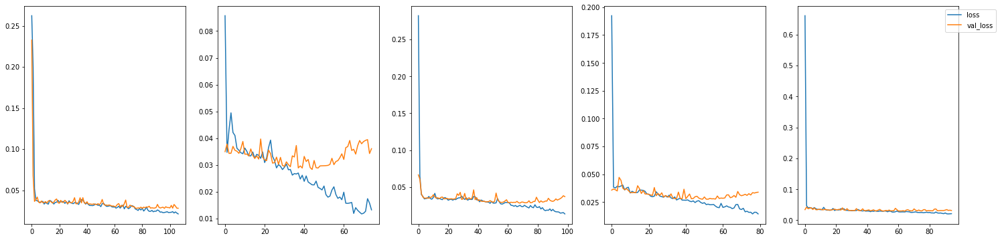

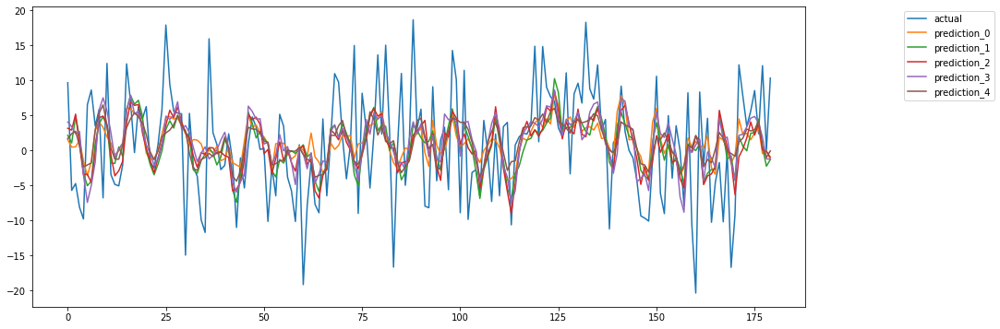

,avg,std
Simple_MLP_20_lags,6.841379238627253,0.03877962839059901
Deep_MLP_20_lags,6.816168797329711,0.09681896929159395
Deep_MLP_Dropout_20_lags,6.840613913110836,0.03938912775176045
RNN_20_lags,7.221211956247743,0.08913248709584208
RNN_RNN_20_lags,7.227104921381164,0.17519504140247913
LSTM_20_lags,7.412183553218727,0.010427501921069324
GRU_20_lags,7.3416056086833565,0.033093169621315734
CNN_2D_20_lags,7.450308666890384,0.40182169836907594
Dropout_CNN_2D_20_lags,7.111474933980612,0.33230589162228347
Deep_CNN_2D_20_lags,7.083155930922876,0.07407210106106486


In [190]:
realistic_noise6_multivariate, X_train, y_train, X_test, y_test, lagged_series_df = new_series_multivariate(realistic_series_noise6, scaler, lags)
realistic_noise6_multivariate_result_20_lags_all_models = evaluate_all_models_multivariate(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, scaler=scaler, verbose=False, plot=True, print_summary=True)
realistic_noise6_multivariate_result_20_lags_all_models

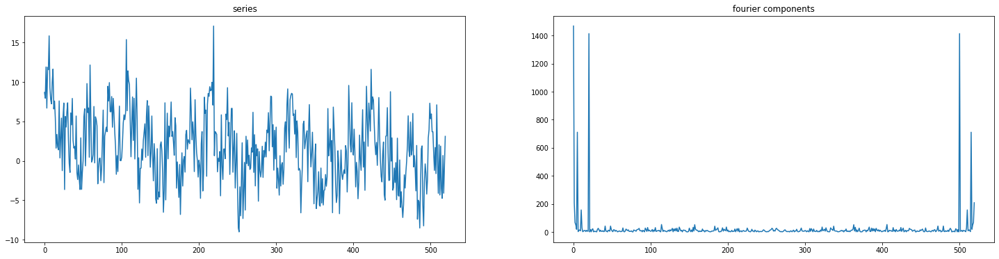

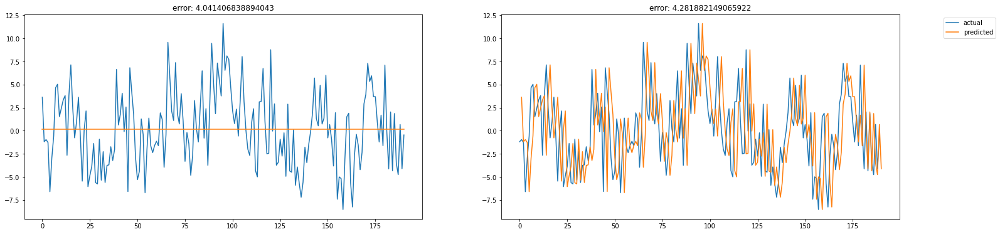

Model: "Simple_MLP_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_854 (Dense)           (None, 20)                2420      
                                                                 
 dense_855 (Dense)           (None, 1)                 21        
                                                                 
Total params: 2,441
Trainable params: 2,441
Non-trainable params: 0
_________________________________________________________________
errors: [3.479885466619359, 3.3505408082948276, 3.433920638696728, 3.477594604449962, 3.393766801863303]
error avg: 3.427141663984836
error std: 0.04970902318522133


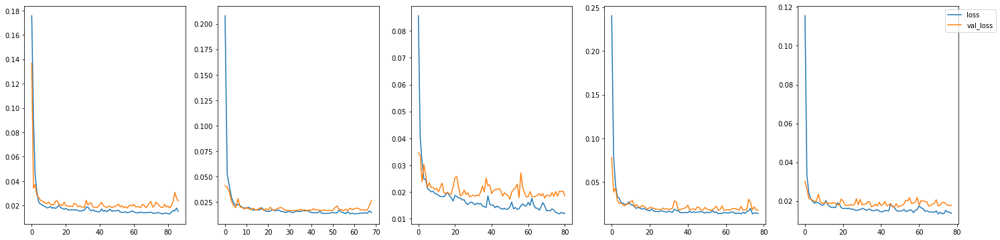

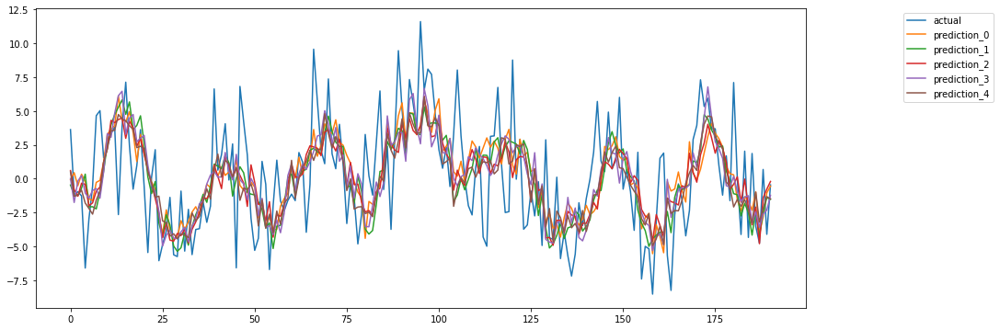

Model: "Deep_MLP_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_856 (Dense)           (None, 20)                2420      
                                                                 
 dense_857 (Dense)           (None, 100)               2100      
                                                                 
 dense_858 (Dense)           (None, 10)                1010      
                                                                 
 dense_859 (Dense)           (None, 1)                 11        
                                                                 
Total params: 5,541
Trainable params: 5,541
Non-trainable params: 0
_________________________________________________________________
errors: [3.3502789306244063, 3.448337268357956, 3.3917617125852995, 3.3502138684153797, 3.332660957540678]
error avg: 3.374650547504744
error std: 0.04165759825084041


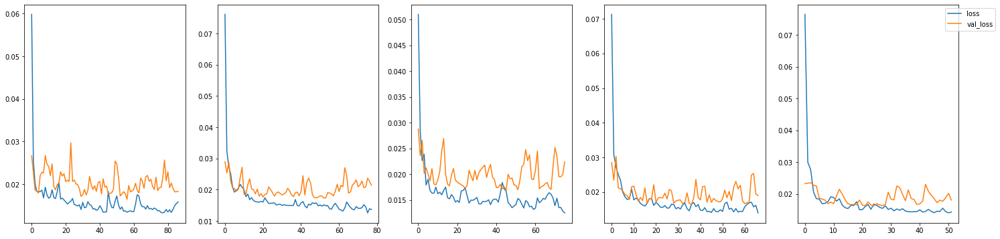

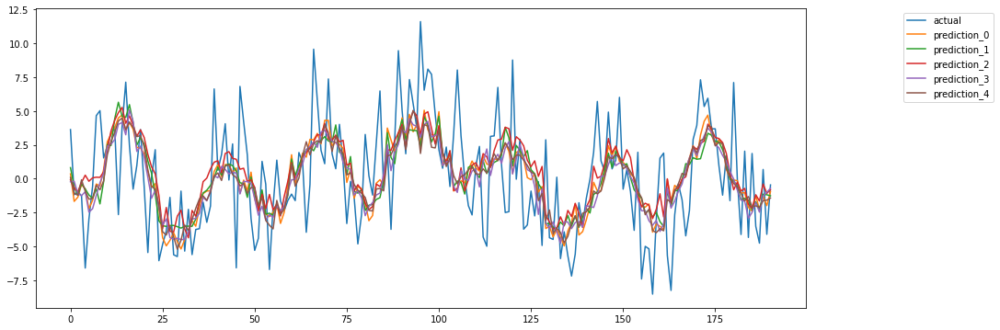

Model: "Deep_MLP_Dropout_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_860 (Dense)           (None, 20)                2420      
                                                                 
 dense_861 (Dense)           (None, 100)               2100      
                                                                 
 dropout_96 (Dropout)        (None, 100)               0         
                                                                 
 dense_862 (Dense)           (None, 10)                1010      
                                                                 
 dense_863 (Dense)           (None, 1)                 11        
                                                                 
Total params: 5,541
Trainable params: 5,541
Non-trainable params: 0
_________________________________________________________________
errors: [3.3820297794937293, 3.390766090

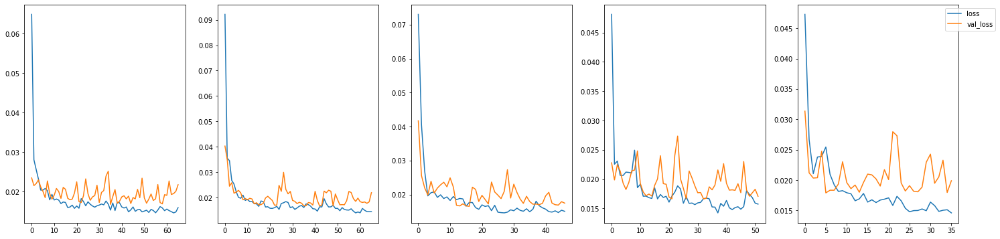

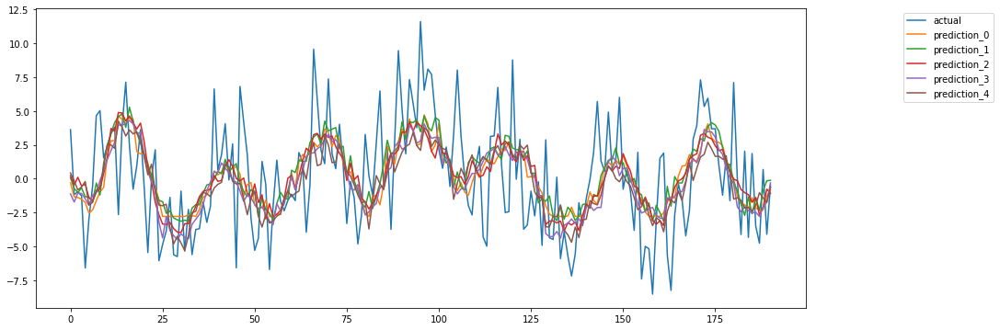

Model: "RNN_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_101 (SimpleRNN)  (None, 20)                540       
                                                                 
 dense_864 (Dense)           (None, 5)                 105       
                                                                 
 dense_865 (Dense)           (None, 1)                 6         
                                                                 
Total params: 651
Trainable params: 651
Non-trainable params: 0
_________________________________________________________________
errors: [3.3807080315253657, 3.513014537636385, 3.496156695887246, 3.5666355678079635, 3.517348027513949]
error avg: 3.494772572074182
error std: 0.06167551517589691


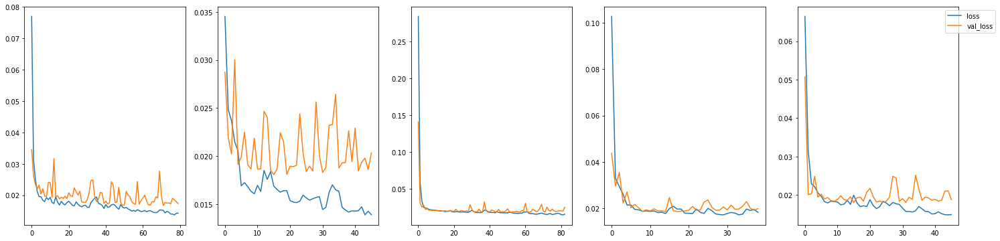

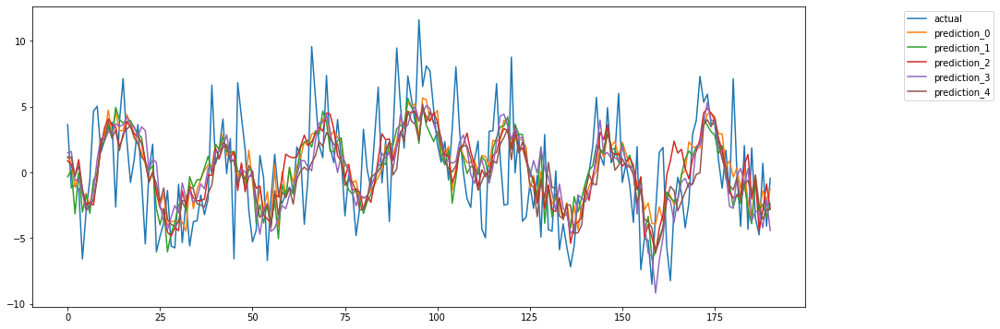

Model: "RNN_RNN_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_102 (SimpleRNN)  (None, 20, 20)            540       
                                                                 
 simple_rnn_103 (SimpleRNN)  (None, 10)                310       
                                                                 
 dense_866 (Dense)           (None, 5)                 55        
                                                                 
 dense_867 (Dense)           (None, 1)                 6         
                                                                 
Total params: 911
Trainable params: 911
Non-trainable params: 0
_________________________________________________________________
errors: [3.477493083359315, 3.528010486640696, 3.470360939053744, 3.627202185205588, 3.4504043051375306]
error avg: 3.5106941998793753
error std: 0.06362062858375886


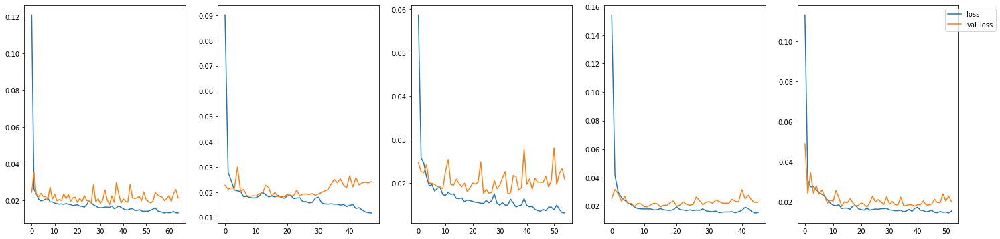

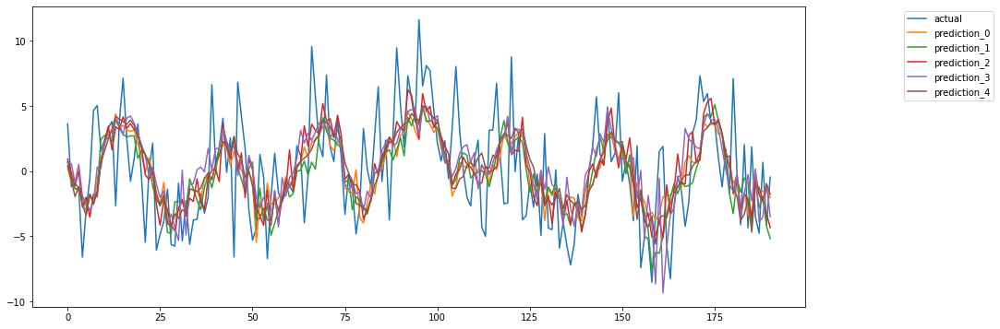

Model: "LSTM_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_32 (LSTM)              (None, 20)                2160      
                                                                 
 dense_868 (Dense)           (None, 5)                 105       
                                                                 
 dense_869 (Dense)           (None, 1)                 6         
                                                                 
Total params: 2,271
Trainable params: 2,271
Non-trainable params: 0
_________________________________________________________________
errors: [3.340740929771969, 3.3527219164961273, 3.337956117331543, 3.359193743769455, 3.3619853386189678]
error avg: 3.3505196091976117
error std: 0.009643833453036755


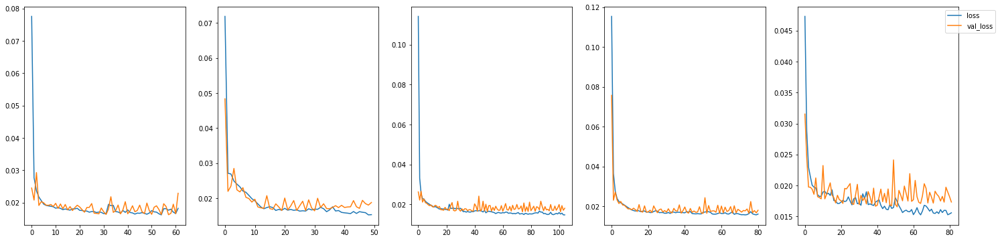

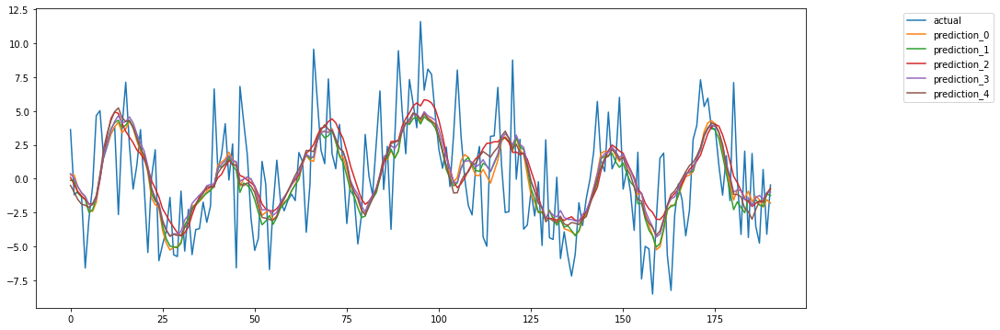

Model: "GRU_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_31 (GRU)                (None, 20)                1680      
                                                                 
 dense_870 (Dense)           (None, 5)                 105       
                                                                 
 dense_871 (Dense)           (None, 1)                 6         
                                                                 
Total params: 1,791
Trainable params: 1,791
Non-trainable params: 0
_________________________________________________________________
errors: [3.315203433242317, 3.385091061550405, 3.3888081323255927, 3.3522662519728144, 3.3393755007349646]
error avg: 3.3561488759652187
error std: 0.027846821355105168


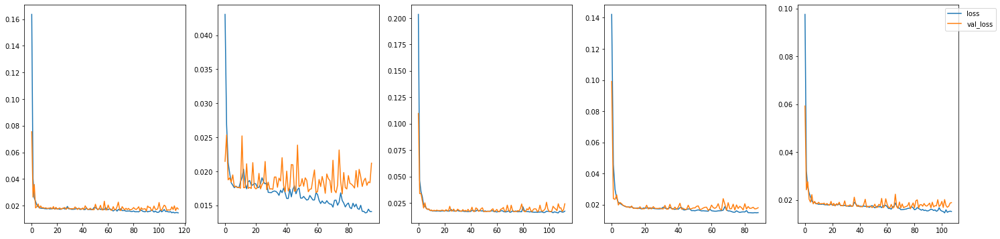

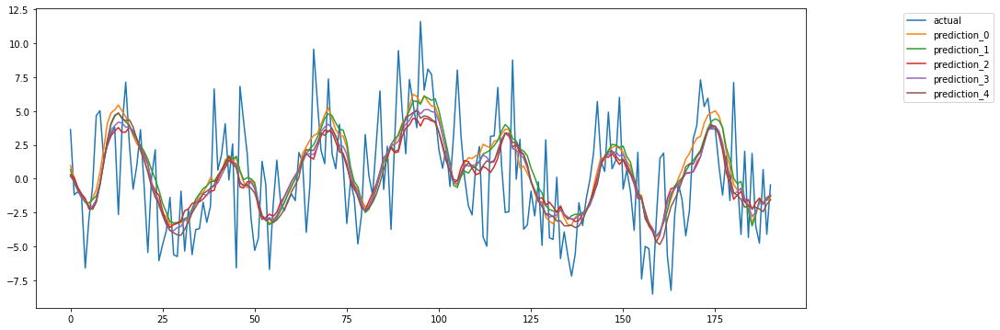

Model: "CNN_2D_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_76 (Conv2D)          (None, 20, 6, 64)         1024      
                                                                 
 flatten_92 (Flatten)        (None, 7680)              0         
                                                                 
 dense_872 (Dense)           (None, 5)                 38405     
                                                                 
 dense_873 (Dense)           (None, 1)                 6         
                                                                 
Total params: 39,435
Trainable params: 39,435
Non-trainable params: 0
_________________________________________________________________
errors: [3.4609766765446843, 3.3778021027035705, 4.041877261675361, 3.400435011412794, 4.04768933703031]
error avg: 3.6657560778733442
error std: 0.31067266461253246


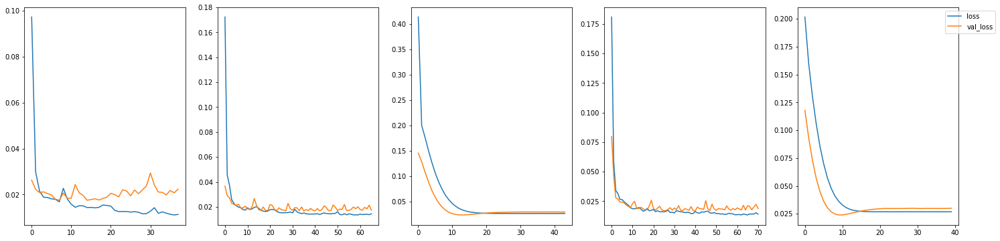

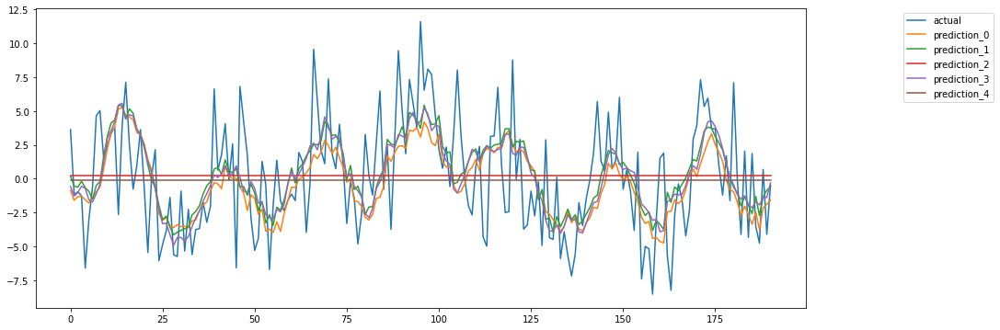

Model: "Dropout_CNN_2D_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_77 (Conv2D)          (None, 20, 6, 64)         1024      
                                                                 
 flatten_93 (Flatten)        (None, 7680)              0         
                                                                 
 dropout_97 (Dropout)        (None, 7680)              0         
                                                                 
 dense_874 (Dense)           (None, 5)                 38405     
                                                                 
 dense_875 (Dense)           (None, 1)                 6         
                                                                 
Total params: 39,435
Trainable params: 39,435
Non-trainable params: 0
_________________________________________________________________
errors: [3.3656495615064363, 4.045438680

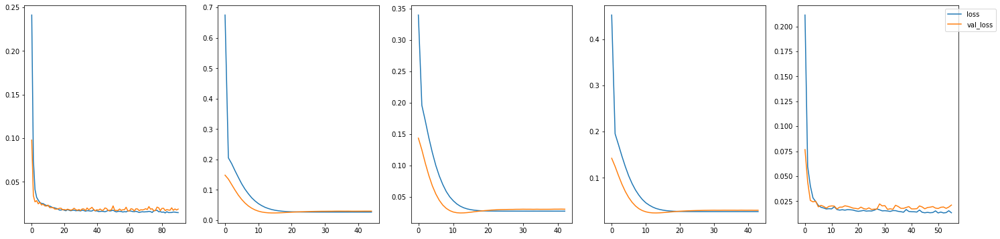

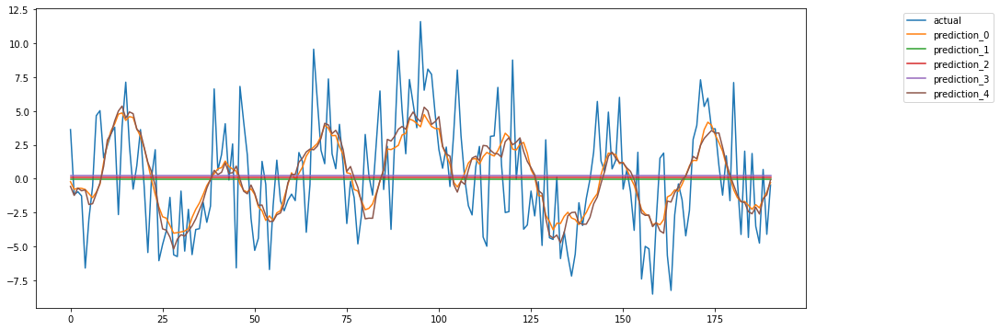

Model: "Deep_CNN_2D_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_78 (Conv2D)          (None, 20, 6, 64)         3264      
                                                                 
 max_pooling2d_19 (MaxPoolin  (None, 10, 3, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_79 (Conv2D)          (None, 6, 1, 64)          61504     
                                                                 
 flatten_94 (Flatten)        (None, 384)               0         
                                                                 
 dropout_98 (Dropout)        (None, 384)               0         
                                                                 
 dense_876 (Dense)           (None, 5)                 1925      
                                               

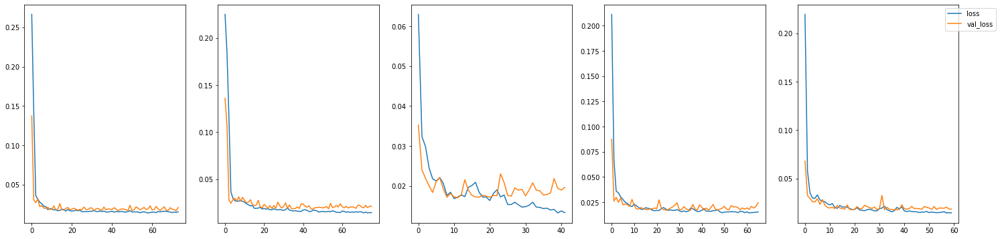

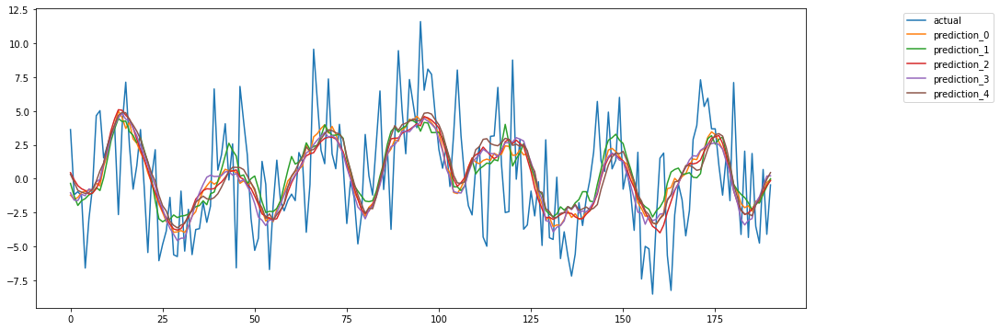

,avg,std
Simple_MLP_20_lags,3.427141663984836,0.04970902318522133
Deep_MLP_20_lags,3.374650547504744,0.04165759825084041
Deep_MLP_Dropout_20_lags,3.399813464951616,0.04839530601474314
RNN_20_lags,3.494772572074182,0.06167551517589691
RNN_RNN_20_lags,3.5106941998793753,0.06362062858375886
LSTM_20_lags,3.3505196091976117,0.009643833453036755
GRU_20_lags,3.3561488759652187,0.027846821355105168
CNN_2D_20_lags,3.6657560778733442,0.31067266461253246
Dropout_CNN_2D_20_lags,3.776182678559158,0.32701245511903765
Deep_CNN_2D_20_lags,3.4345740028888314,0.04962147992332866


In [191]:
complex_series_noise3_multivariate, X_train, y_train, X_test, y_test, lagged_series_df = new_series_multivariate(complex_series_noise3, scaler, lags)
complex_series_noise3_multivariate_result_20_lags_all_models = evaluate_all_models_multivariate(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, scaler=scaler, verbose=False, plot=True, print_summary=True)
complex_series_noise3_multivariate_result_20_lags_all_models

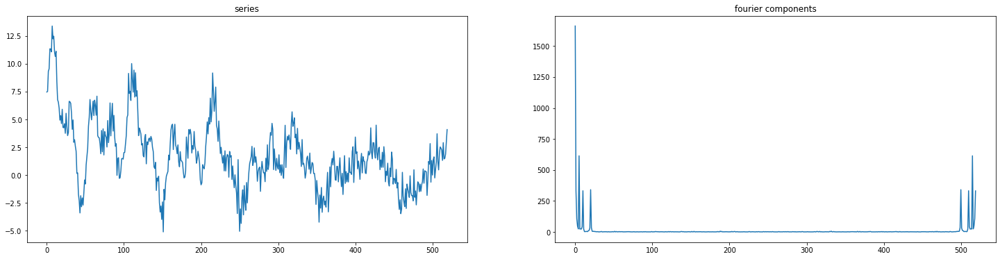

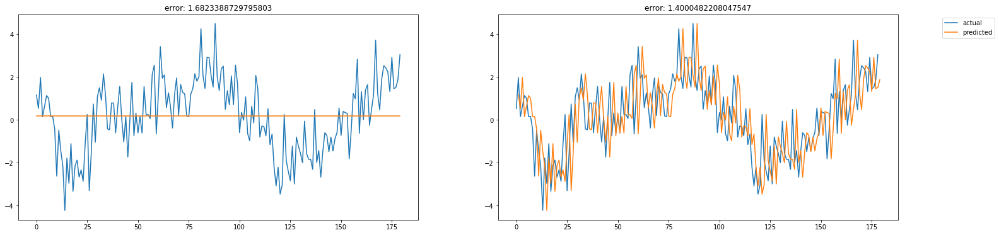

Model: "Simple_MLP_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_878 (Dense)           (None, 20)                2420      
                                                                 
 dense_879 (Dense)           (None, 1)                 21        
                                                                 
Total params: 2,441
Trainable params: 2,441
Non-trainable params: 0
_________________________________________________________________
errors: [1.1318110644450607, 1.1455915721621908, 1.1580975650900516, 1.1724971163354994, 1.098052882382163]
error avg: 1.1412100400829932
error std: 0.025432846747904473


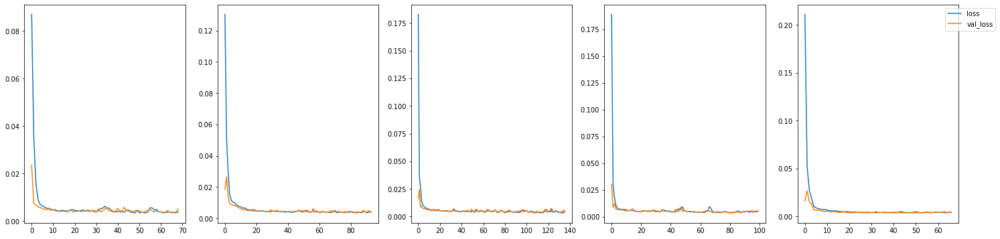

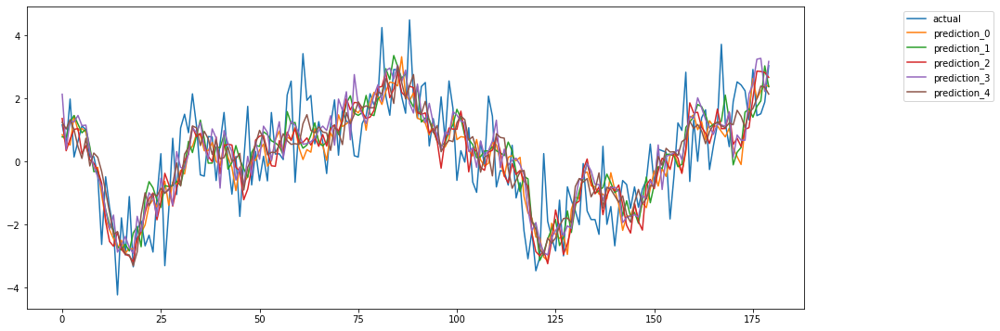

Model: "Deep_MLP_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_880 (Dense)           (None, 20)                2420      
                                                                 
 dense_881 (Dense)           (None, 100)               2100      
                                                                 
 dense_882 (Dense)           (None, 10)                1010      
                                                                 
 dense_883 (Dense)           (None, 1)                 11        
                                                                 
Total params: 5,541
Trainable params: 5,541
Non-trainable params: 0
_________________________________________________________________
errors: [1.6833729053441684, 1.123021823442751, 1.1553262737980816, 1.116740359653608, 1.0685935721148898]
error avg: 1.2294109868706997
error std: 0.22866811467989942


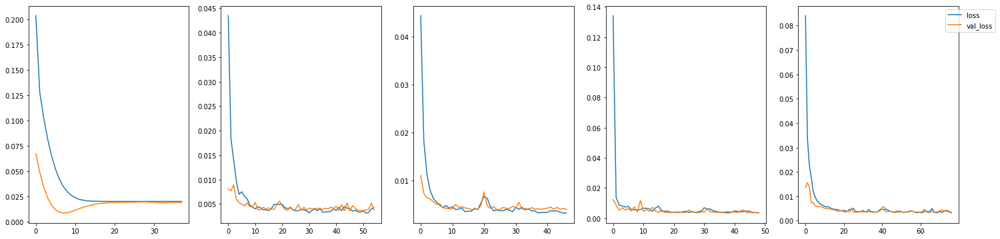

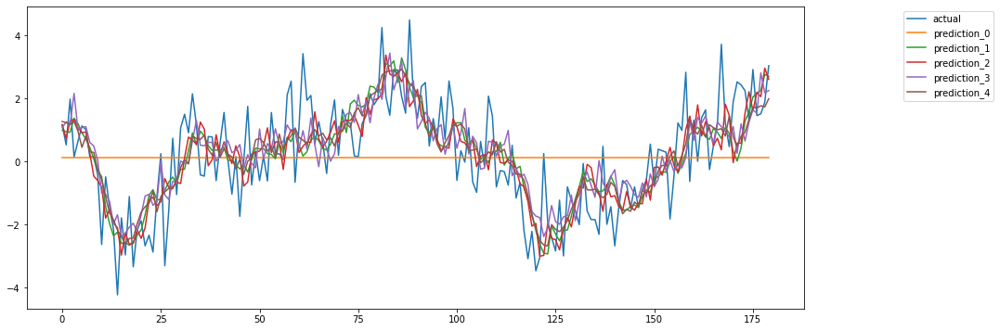

Model: "Deep_MLP_Dropout_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_884 (Dense)           (None, 20)                2420      
                                                                 
 dense_885 (Dense)           (None, 100)               2100      
                                                                 
 dropout_99 (Dropout)        (None, 100)               0         
                                                                 
 dense_886 (Dense)           (None, 10)                1010      
                                                                 
 dense_887 (Dense)           (None, 1)                 11        
                                                                 
Total params: 5,541
Trainable params: 5,541
Non-trainable params: 0
_________________________________________________________________
errors: [1.1058273892505444, 1.099041755

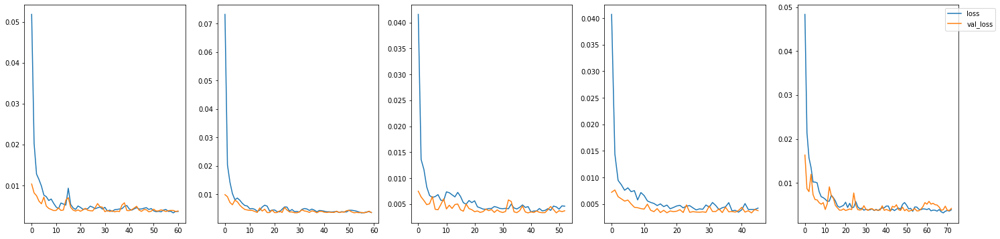

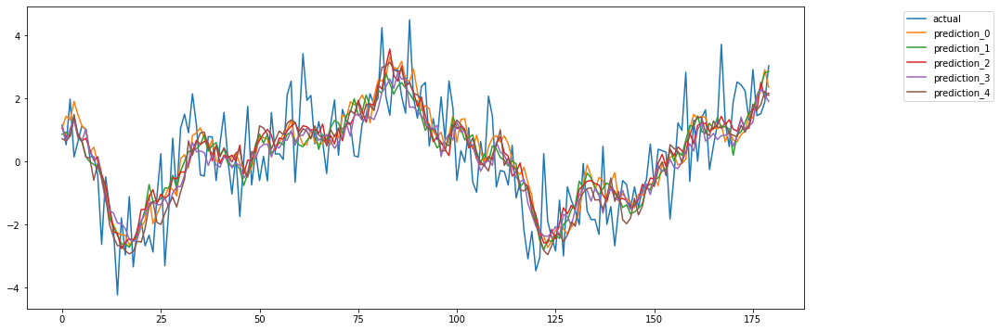

Model: "RNN_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_104 (SimpleRNN)  (None, 20)                540       
                                                                 
 dense_888 (Dense)           (None, 5)                 105       
                                                                 
 dense_889 (Dense)           (None, 1)                 6         
                                                                 
Total params: 651
Trainable params: 651
Non-trainable params: 0
_________________________________________________________________
errors: [1.1521186895902273, 1.253894653420123, 1.2197431666129221, 1.1801248374521993, 1.1905622396198356]
error avg: 1.1992887173390616
error std: 0.034838513096611685


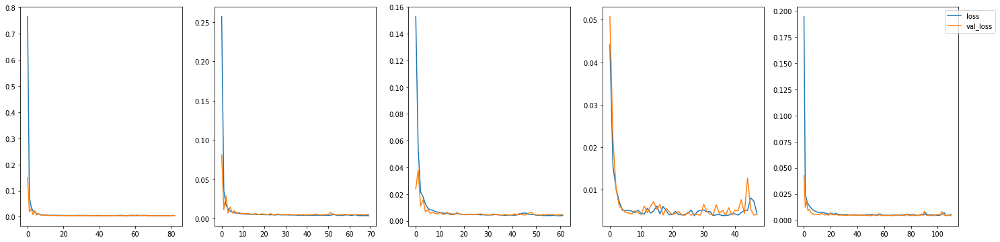

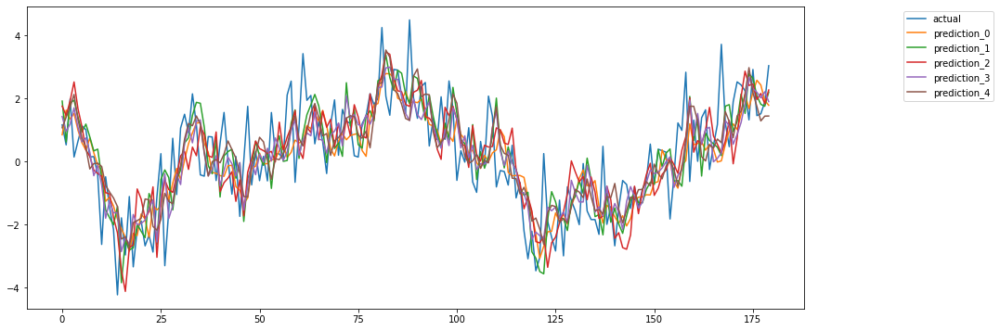

Model: "RNN_RNN_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_105 (SimpleRNN)  (None, 20, 20)            540       
                                                                 
 simple_rnn_106 (SimpleRNN)  (None, 10)                310       
                                                                 
 dense_890 (Dense)           (None, 5)                 55        
                                                                 
 dense_891 (Dense)           (None, 1)                 6         
                                                                 
Total params: 911
Trainable params: 911
Non-trainable params: 0
_________________________________________________________________
errors: [1.2383581460402466, 1.2285196291922917, 1.1822790545740498, 1.187259238030736, 1.1420543156971046]
error avg: 1.195694076706886
error std: 0.03471620080468932


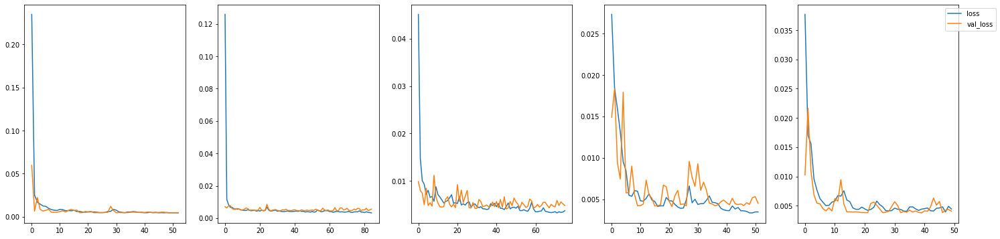

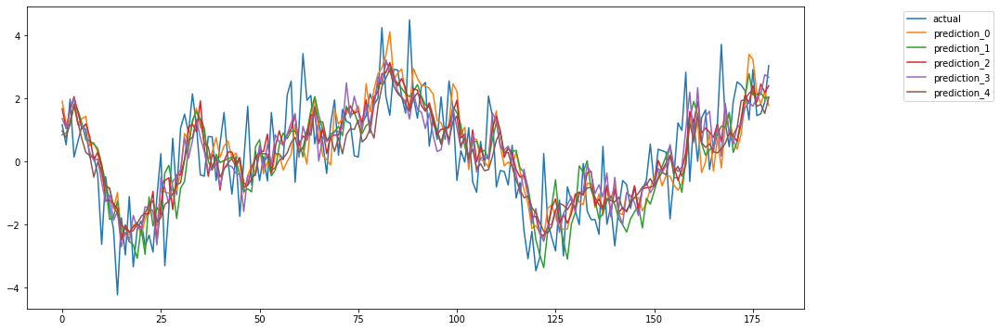

Model: "LSTM_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_33 (LSTM)              (None, 20)                2160      
                                                                 
 dense_892 (Dense)           (None, 5)                 105       
                                                                 
 dense_893 (Dense)           (None, 1)                 6         
                                                                 
Total params: 2,271
Trainable params: 2,271
Non-trainable params: 0
_________________________________________________________________
errors: [1.1102086411191272, 1.1068801563676811, 1.113999693443813, 1.1130557015174245, 1.1007993455983114]
error avg: 1.1089887076092715
error std: 0.004788534112572805


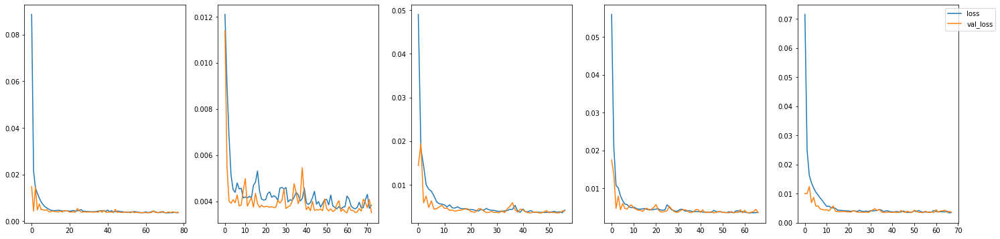

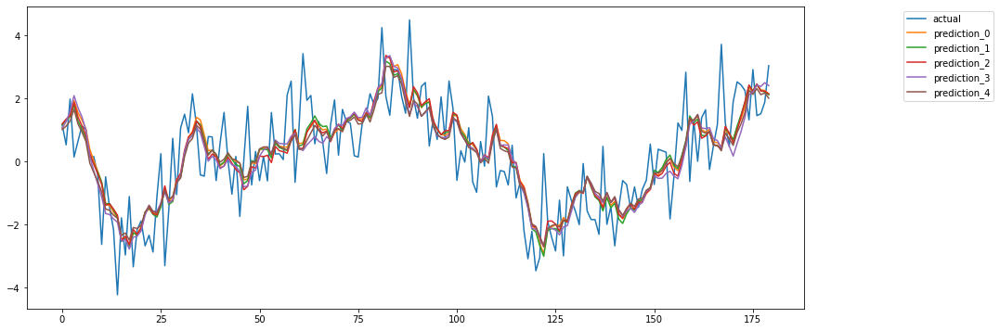

Model: "GRU_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_32 (GRU)                (None, 20)                1680      
                                                                 
 dense_894 (Dense)           (None, 5)                 105       
                                                                 
 dense_895 (Dense)           (None, 1)                 6         
                                                                 
Total params: 1,791
Trainable params: 1,791
Non-trainable params: 0
_________________________________________________________________
errors: [1.1310432551074239, 1.1592061625860017, 1.1481524127741438, 1.1321765622041486, 1.1247865264459482]
error avg: 1.1390729838235334
error std: 0.012680070630393803


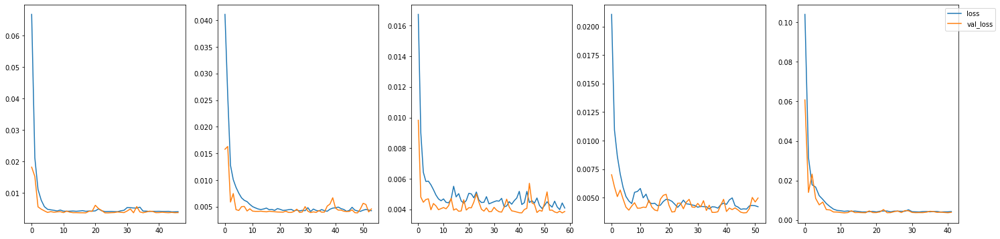

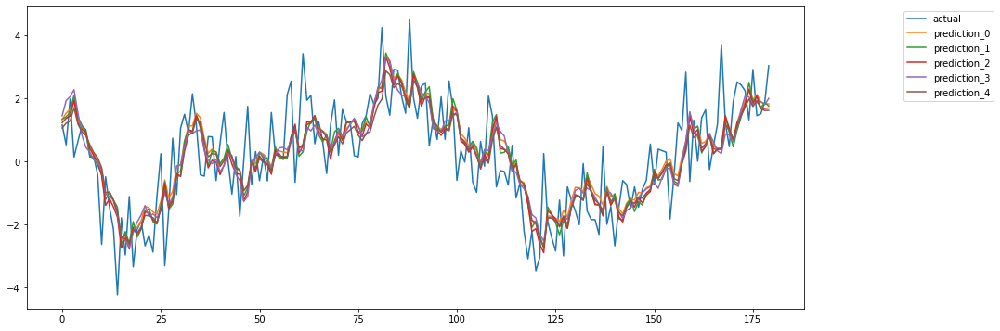

Model: "CNN_2D_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_80 (Conv2D)          (None, 20, 6, 64)         1024      
                                                                 
 flatten_95 (Flatten)        (None, 7680)              0         
                                                                 
 dense_896 (Dense)           (None, 5)                 38405     
                                                                 
 dense_897 (Dense)           (None, 1)                 6         
                                                                 
Total params: 39,435
Trainable params: 39,435
Non-trainable params: 0
_________________________________________________________________
errors: [1.6849408609822225, 1.686029471944257, 1.686584588984281, 1.1378984019772513, 1.6866056327190238]
error avg: 1.5764117913214073
error std: 0.21925752690728864


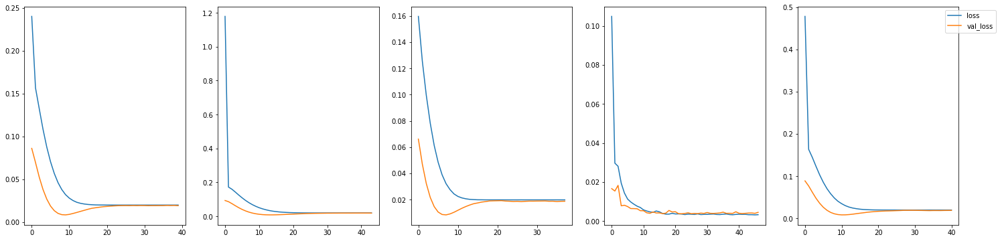

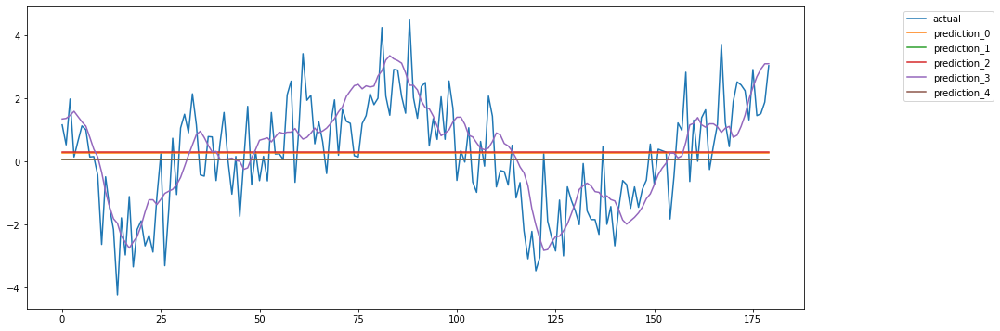

Model: "Dropout_CNN_2D_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_81 (Conv2D)          (None, 20, 6, 64)         1024      
                                                                 
 flatten_96 (Flatten)        (None, 7680)              0         
                                                                 
 dropout_100 (Dropout)       (None, 7680)              0         
                                                                 
 dense_898 (Dense)           (None, 5)                 38405     
                                                                 
 dense_899 (Dense)           (None, 1)                 6         
                                                                 
Total params: 39,435
Trainable params: 39,435
Non-trainable params: 0
_________________________________________________________________
errors: [1.1116157079561055, 1.685756887

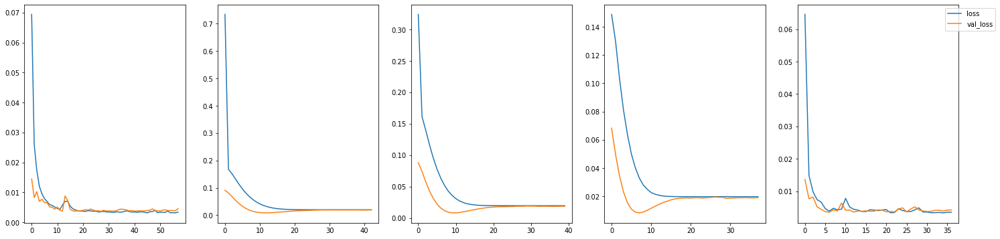

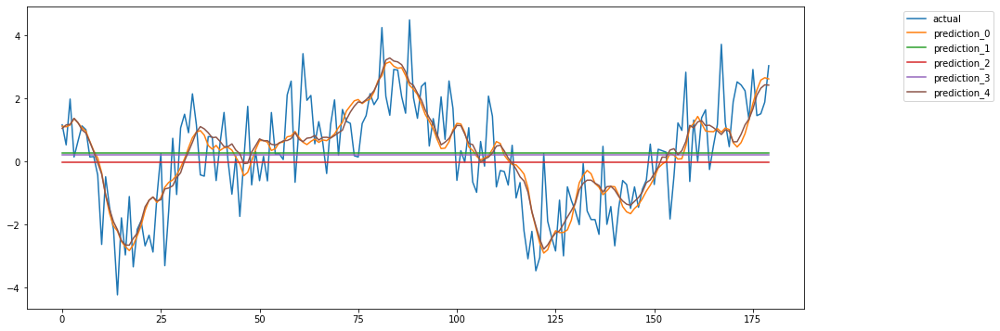

Model: "Deep_CNN_2D_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_82 (Conv2D)          (None, 20, 6, 64)         3264      
                                                                 
 max_pooling2d_20 (MaxPoolin  (None, 10, 3, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_83 (Conv2D)          (None, 6, 1, 64)          61504     
                                                                 
 flatten_97 (Flatten)        (None, 384)               0         
                                                                 
 dropout_101 (Dropout)       (None, 384)               0         
                                                                 
 dense_900 (Dense)           (None, 5)                 1925      
                                               

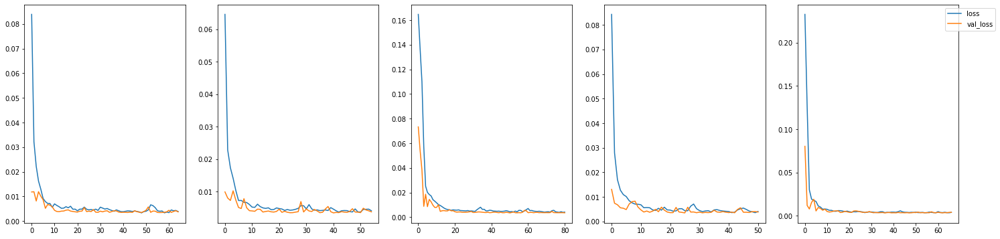

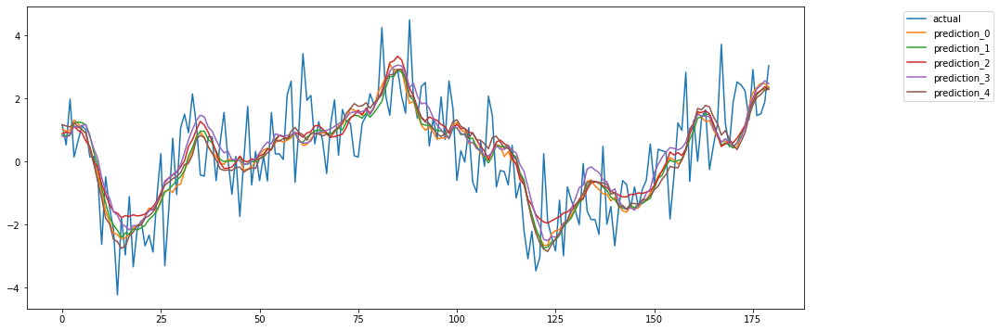

,avg,std
Simple_MLP_20_lags,1.1412100400829932,0.025432846747904473
Deep_MLP_20_lags,1.2294109868706997,0.22866811467989942
Deep_MLP_Dropout_20_lags,1.0930195627712804,0.012906628896807113
RNN_20_lags,1.1992887173390616,0.034838513096611685
RNN_RNN_20_lags,1.195694076706886,0.03471620080468932
LSTM_20_lags,1.1089887076092715,0.004788534112572805
GRU_20_lags,1.1390729838235334,0.012680070630393803
CNN_2D_20_lags,1.5764117913214073,0.21925752690728864
Dropout_CNN_2D_20_lags,1.4538084636722584,0.2867203871946537
Deep_CNN_2D_20_lags,1.0958298219497753,0.008516388690698883


In [192]:
complex_fasing_series_noise3, X_train, y_train, X_test, y_test, lagged_series_df = new_series_multivariate(complex_fasing_series_noise3, scaler, lags)
complex_fasing_series_noise3_multivariate_result_20_lags_all_models = evaluate_all_models_multivariate(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, scaler=scaler, verbose=False, plot=True, print_summary=True)
complex_fasing_series_noise3_multivariate_result_20_lags_all_models